In [1]:
import numpy as np
import scipy

import cupy as cp
import cupyx.scipy

import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output, display, HTML
display(HTML("<style>.container { width:90% !important; }</style>")) # just making the notebook cells wider
from datetime import datetime
today = int(datetime.today().strftime('%Y%m%d'))

from importlib import reload
import time

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('DEBUG')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import cgi_phasec_poppy

import ray
if not ray.is_initialized():
    ray.init(log_to_driver=False)

from math_module import xp, ensure_np_array
import iefc_2dm

import utils
from imshows import *

data_dir = iefc_2dm.iefc_data_dir
response_dir = data_dir/'response-data'

INFO:numexpr.utils:Note: NumExpr detected 64 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


2023-07-21 18:53:17,042	INFO worker.py:1636 -- Started a local Ray instance.


In [3]:
iefc_2dm.iefc_dir

PosixPath('/home/kianmilani/Projects/roman-cgi-iefc-data')

[51636758.47108228 50670246.26696116 49426702.04556602] ph / (s m2)
[51631679.18980549 50665307.65062586 49421984.02344474] ph / (s m2)


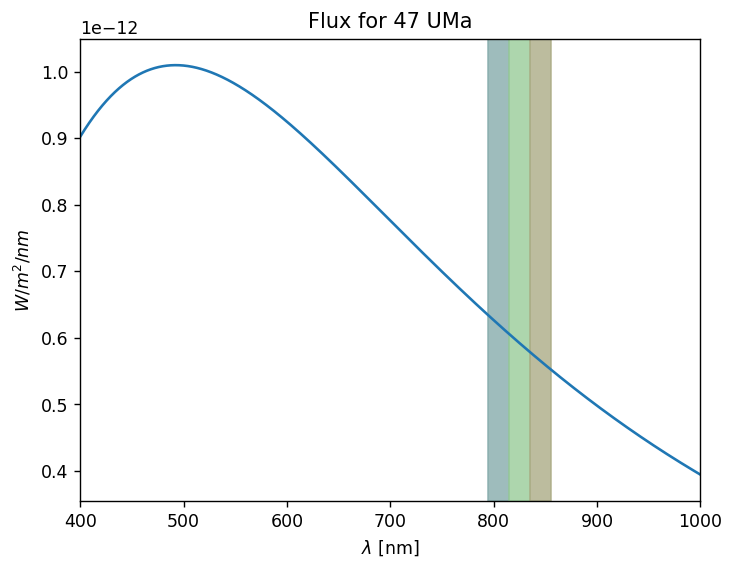

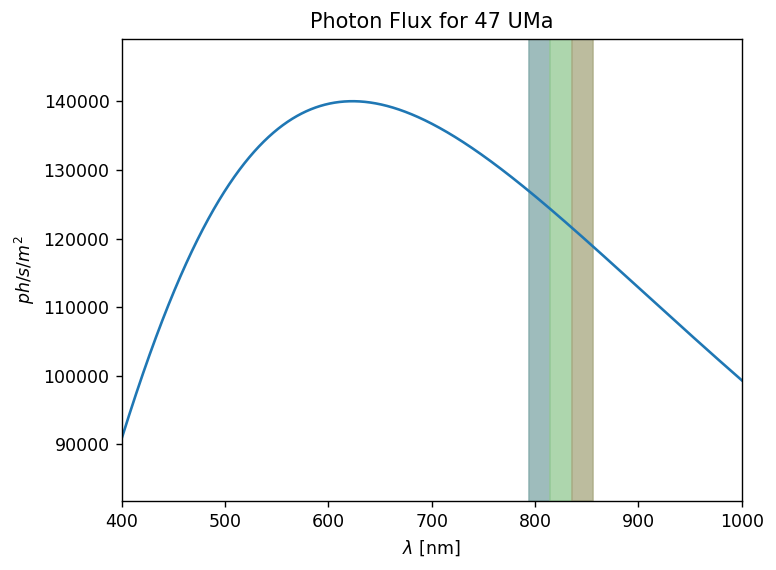

In [2]:
reload(cgi_phasec_poppy.source_flux)

wavelength_c = 825e-9*u.m

nlam = 3
bandwidth = 0.05
minlam = wavelength_c * (1 - bandwidth/2)
maxlam = wavelength_c * (1 + bandwidth/2)
wavelengths = np.linspace( minlam, maxlam, nlam )

from astropy.constants import h, c, k_B, R_sun

uma47 = cgi_phasec_poppy.source_flux.SOURCE(wavelengths=wavelengths,
                                            temp=5887*u.K,
                                            distance=14.06*u.parsec,
                                            diameter=2*1.172*R_sun,
                                            name='47 UMa')

uma47.plot_spectrum()
source_fluxes = uma47.calc_fluxes()
print(source_fluxes)

uma47.plot_spectrum_ph()
source_fluxes = uma47.calc_fluxes_ph()
print(source_fluxes)

In [3]:
reload(cgi_phasec_poppy.cgi)
reload(cgi_phasec_poppy.parallelized_cgi)

rayCGI = ray.remote(cgi_phasec_poppy.cgi.CGI) # make a ray actor class from the original CGI class  

kwargs = {
    'cgi_mode':'spc-wide',
    'npsf':148,
    'use_pupil_defocus':True,
    'use_opds':True,
    'polaxis':10,
}

actors = []
for i in range(nlam):
    actors.append(rayCGI.options(num_cpus=2, num_gpus=1/8).remote(**kwargs))
    actors[i].setattr.remote('wavelength', wavelengths[i])
    actors[i].setattr.remote('source_flux', source_fluxes[i])

In [4]:
!nvidia-smi

Fri Jul 21 18:54:08 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100 80GB PCIe           On | 00000000:25:00.0 Off |                    0 |
| N/A   30C    P0               62W / 300W|   1543MiB / 81920MiB |      2%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

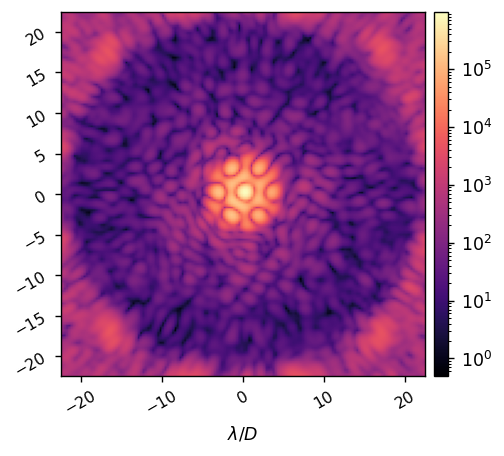

959017.2017952785

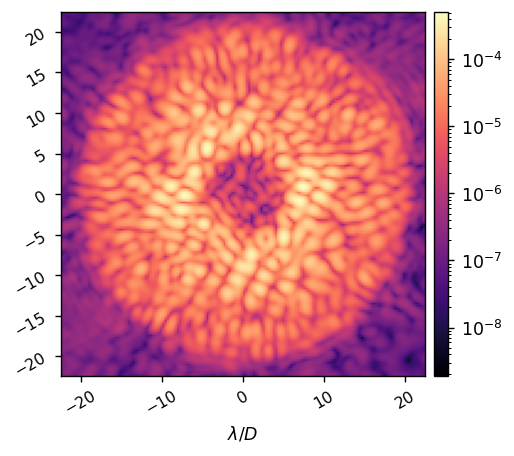

In [5]:
reload(cgi_phasec_poppy.parallelized_cgi)
mode = cgi_phasec_poppy.parallelized_cgi.ParallelizedCGI(actors=actors)

mode.set_actor_attr('use_fpm',False)
ref_unocc_im = mode.snap()
imshow1(ref_unocc_im, pxscl=mode.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

max_ref = ref_unocc_im.get().max()
display(max_ref)

mode.set_actor_attr('use_fpm',True)
mode.Iref = max_ref
ref_im = mode.snap()
imshow1(ref_im, pxscl=mode.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True)

In [11]:
imshow1(ref_im, pxscl=mode.psf_pixelscale_lamD, xlabel='$\lambda/D$', lognorm=True, 
        display_fig=False, 
        save_fig='figures/bbspc_wfov_initial_state.png')

# Create dark hole ROI to calibrate and control

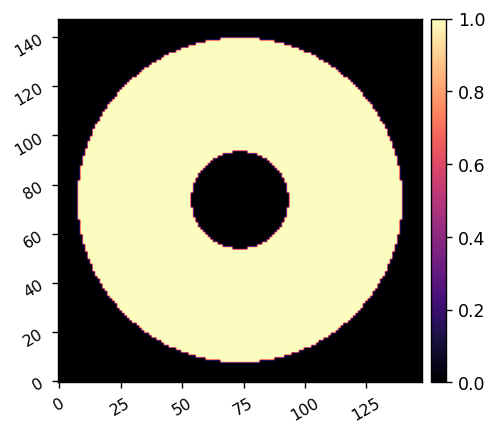

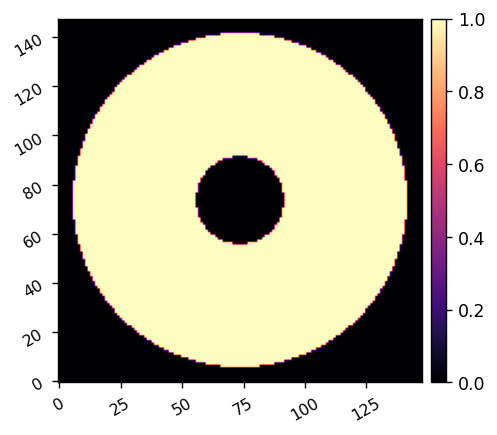

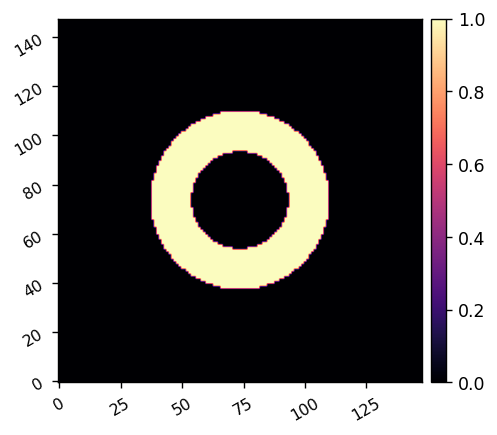

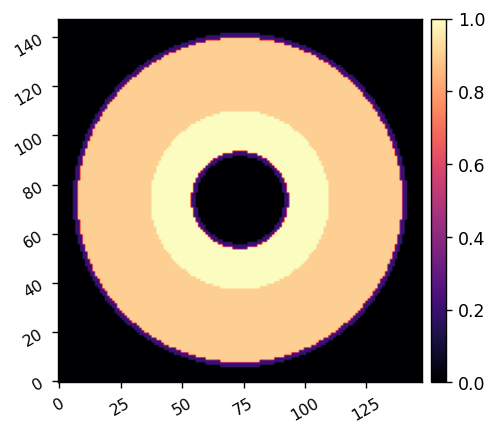

In [6]:
xfp = (xp.linspace(-mode.npsf/2, mode.npsf/2-1, mode.npsf) + 1/2)*mode.psf_pixelscale_lamD
fpx,fpy = xp.meshgrid(xfp,xfp)
  
iwa = 6
owa = 20
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi1 = utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

iwa = 5.4
owa = 20.6
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi2 = utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

iwa = 6
owa = 11
roi_params = {
        'inner_radius' : iwa,
        'outer_radius' : owa,
#         'edge' : 2,
        'rotation':0,
        'full':True,
    }
roi3 = utils.create_annular_focal_plane_mask(fpx, fpy, roi_params, plot=True)

relative_weight_1 = 0.9
relative_weight_2 = 0.2
weight_map = roi3 + relative_weight_1*(roi1*~roi3) + relative_weight_2*(roi2*~roi1*~roi3)
control_mask = weight_map>0
imshow1(weight_map,)

# Create calibration and probe modes

In [18]:
ray.get(actors[0].getattr.remote('Nacts'))

1804

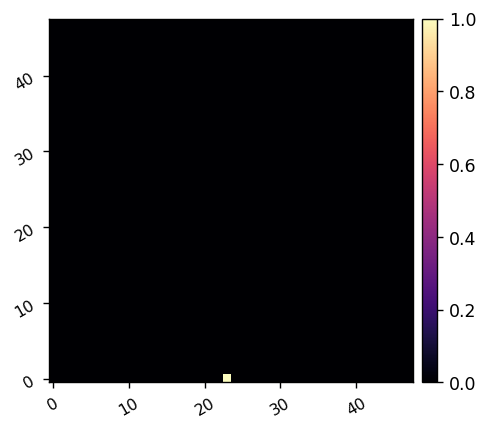

In [7]:
calib_amp = 2.5e-9

calib_modes = xp.zeros((mode.Nacts, mode.Nact, mode.Nact))
count=0
for i in range(mode.Nact):
    for j in range(mode.Nact):
        if mode.dm_mask[i,j]:
            calib_modes[count, i,j] = 1
            count+=1
            
calib_modes = calib_modes[:,:].reshape(mode.Nacts, mode.Nact**2)

import time
for i in range(mode.Nacts):
    try:
        imshow1(calib_modes[i].reshape(mode.Nact,mode.Nact))
        clear_output(wait=True)
        time.sleep(0.25)
    except KeyboardInterrupt:
        break

In [14]:
mode.npsf

148

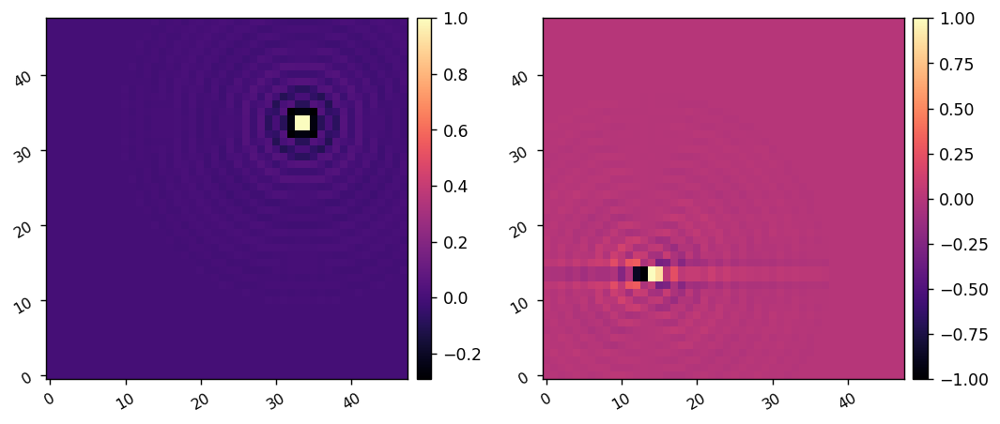

In [8]:
reload(utils)
probe_amp = 2e-8
fourier_modes, fs = utils.select_fourier_modes(mode, control_mask*(fpx>0), fourier_sampling=0.5) 
probe_modes = utils.create_fourier_probes(fourier_modes, shift_cos=(10,10), shift_sin=(-10,-10), plot=True)

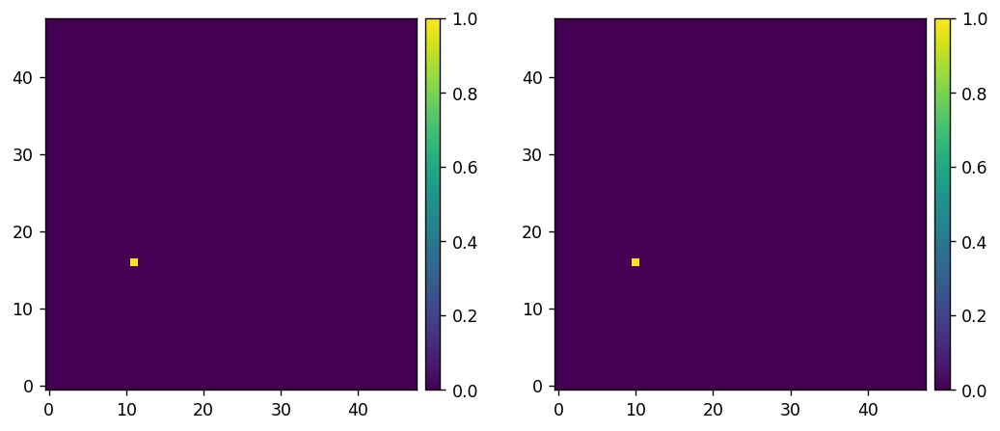

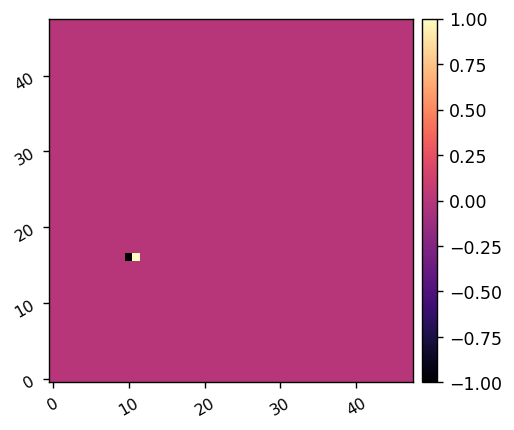

In [9]:
probe_amp = 2.5e-8

# poke_probes = wfsc.utils.create_probe_poke_modes(Nact, [(Nact//2, Nact//5), (Nact//2, Nact//5+2)], plot=True)
probe_modes = utils.create_probe_poke_modes(mode.Nact,  [(mode.Nact//5+2, mode.Nact//3), (mode.Nact//5+1, mode.Nact//3)], plot=True)
imshow1(probe_modes[0] - probe_modes[1])

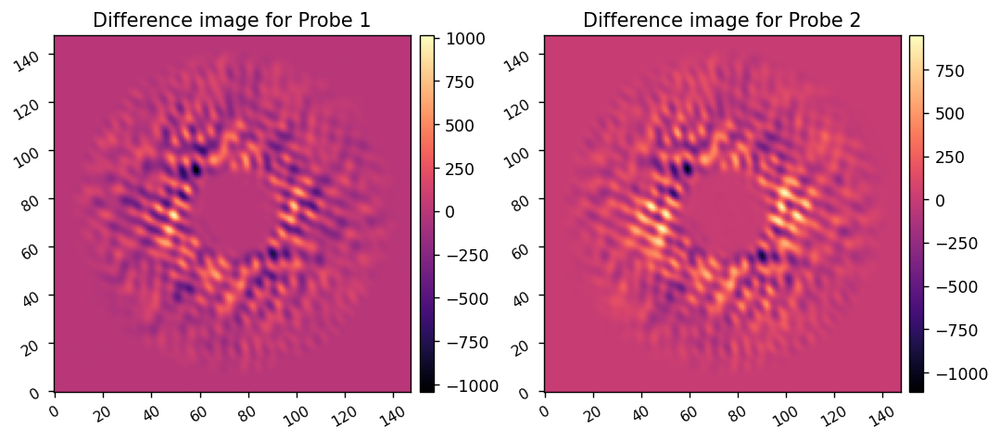

In [15]:
reload(iefc_2dm)

differential_images, single_images = iefc_2dm.take_measurement(mode, 
                                                                   probe_modes, 
                                                                    probe_amp, 
                                                                   return_all=True)
ims = differential_images.reshape(probe_modes.shape[0], mode.npsf, mode.npsf)
imshow2(ims[0], ims[1], 'Difference image for Probe 1', 'Difference image for Probe 2')

In [9]:
4.6*1780/3600

2.2744444444444443

In [ ]:
reload(iefc_2dm)

probe_amp = 2.5e-8

response_matrix, response_cube = iefc_2dm.calibrate(mode, 
                                                         control_mask,
                                                         probe_amp, probe_modes, 
                                                         calib_amp, ensure_np_array(calib_modes), 
                                                         return_all=True)


In [10]:
# date = 20230630
# date = 20230703
# date = 20230713
date = 20230720
response_matrix = xp.array(fits.getdata(response_dir/f'bbspc_wfov_iefc_2dm_poke_response_matrix_{date}.fits'))
# response_cube = xp.array(fits.getdata(data_dir/'response-data'/f'bbspc_wfov_iefc_2dm_poke_response_cube_{date}.fits'))

In [18]:
response_matrix.shape

(27048, 3608)

In [19]:
!nvidia-smi

Fri Jul 21 13:58:25 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100 80GB PCIe           On | 00000000:25:00.0 Off |                    0 |
| N/A   32C    P0               63W / 300W|  18397MiB / 81920MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [42]:
148**2, 2*control_mask.sum()

(21904, array(27048))

In [25]:
mode.Nacts

1804

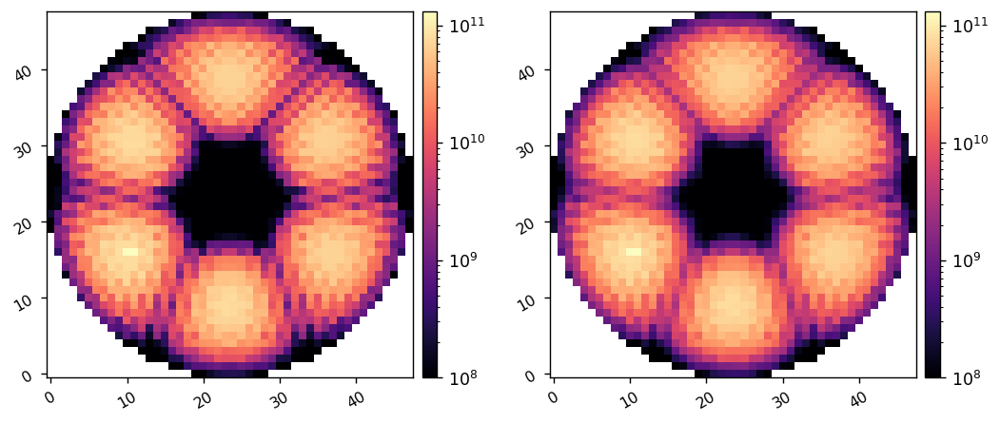

In [11]:
reload(utils)
dm1_response_sum = utils.map_acts_to_dm(xp.sqrt(xp.sum(abs(response_matrix)**2, axis=0))[:mode.Nacts], mode.dm_mask)
dm2_response_sum = utils.map_acts_to_dm(xp.sqrt(xp.sum(abs(response_matrix)**2, axis=0))[mode.Nacts:], mode.dm_mask)
imshow2(dm1_response_sum , dm2_response_sum, lognorm=True, vmin1=1e8, vmin2=1e8)

# fp_response_sum = xp.sum(abs(response_cube), axis=(0,1)).reshape(mode.npsf, mode.npsf)
# imshow1(fp_response_sum, lognorm=True,)

# Run IEFC

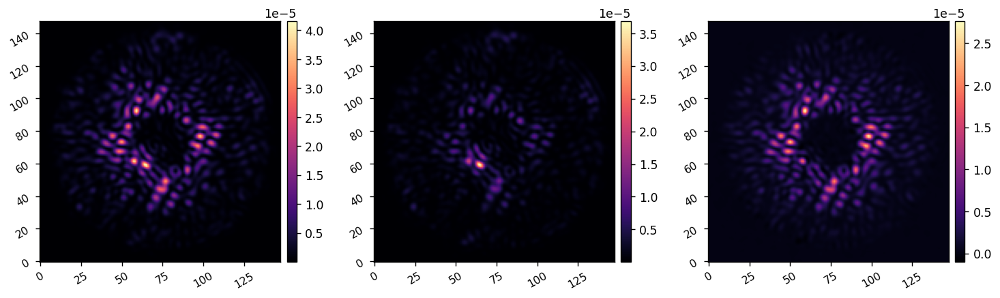

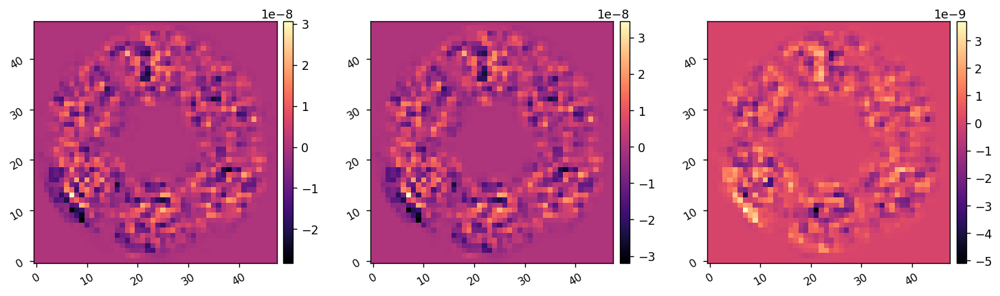

In [14]:
imshow3(images[2], images[3], images[2]-images[3])
imshow3(dm1_commands[2], dm1_commands[3], dm1_commands[2]-dm1_commands[3])

Using regulariztaion condition number of 1.0e-03 for 10 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 1 / 10
	Mean Contrast of this iteration: 8.393e-06


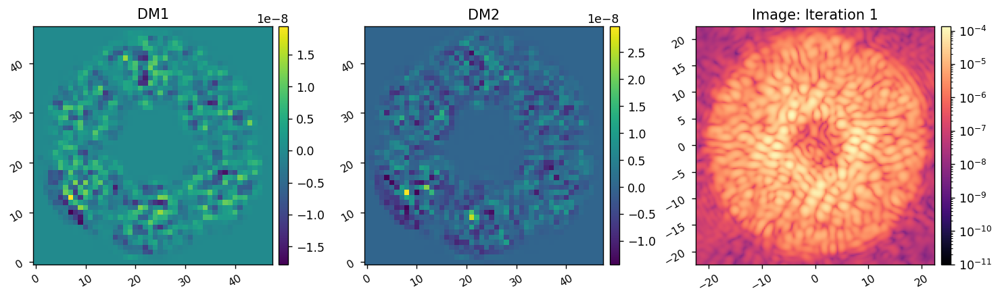

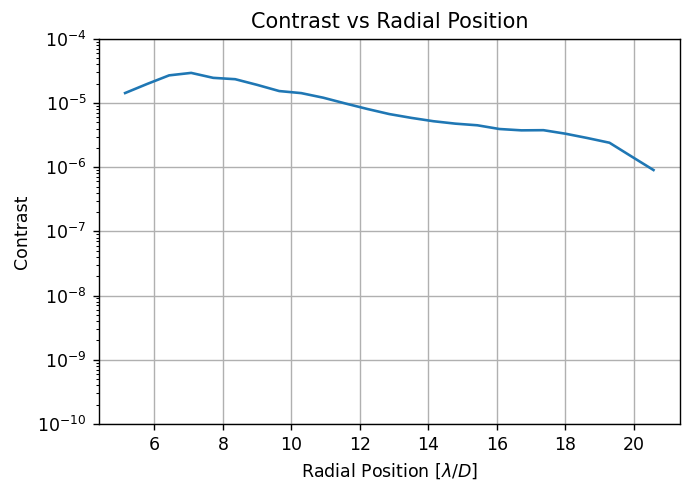

	Closed-loop iteration 2 / 10
	Mean Contrast of this iteration: 2.595e-06


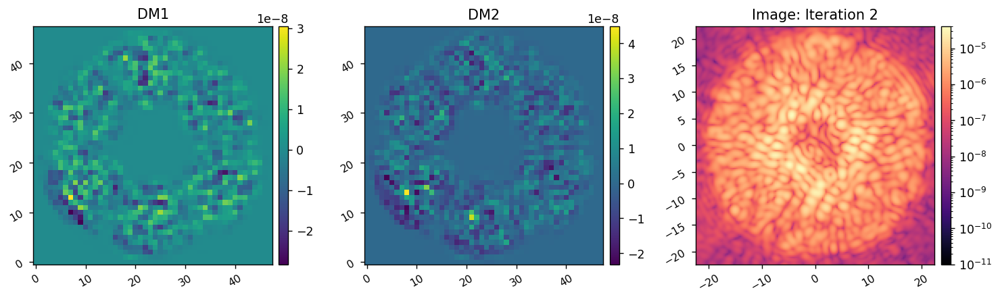

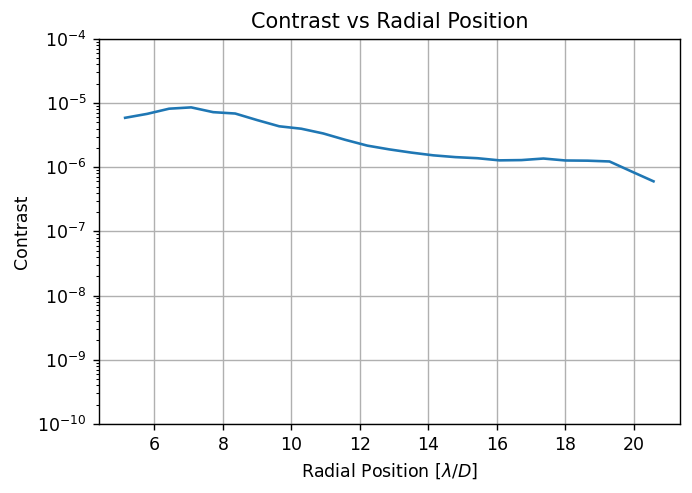

	Closed-loop iteration 3 / 10
	Mean Contrast of this iteration: 1.003e-06


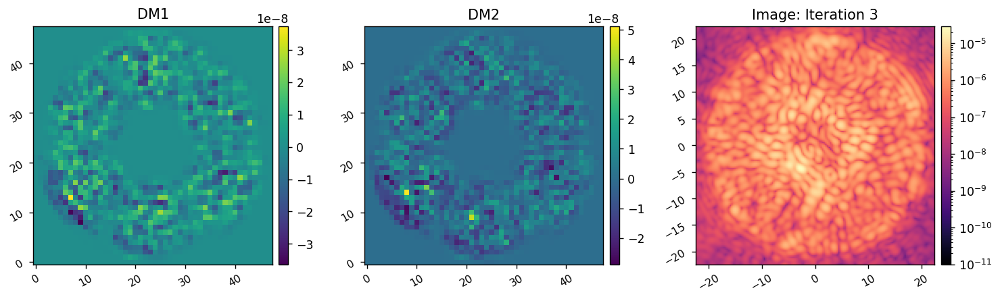

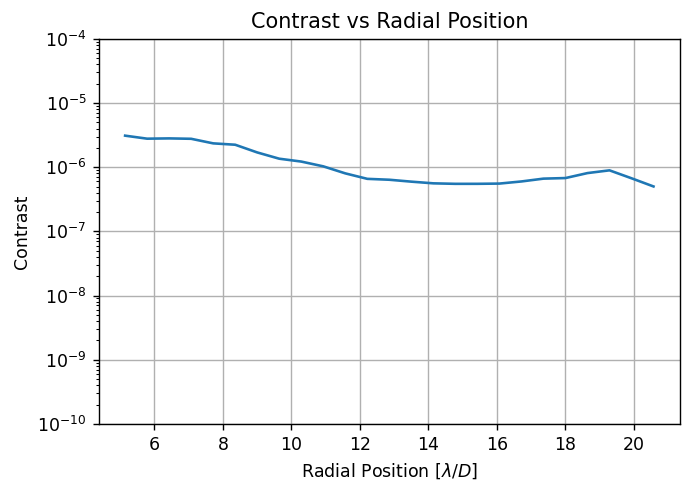

	Closed-loop iteration 4 / 10
	Mean Contrast of this iteration: 5.271e-07


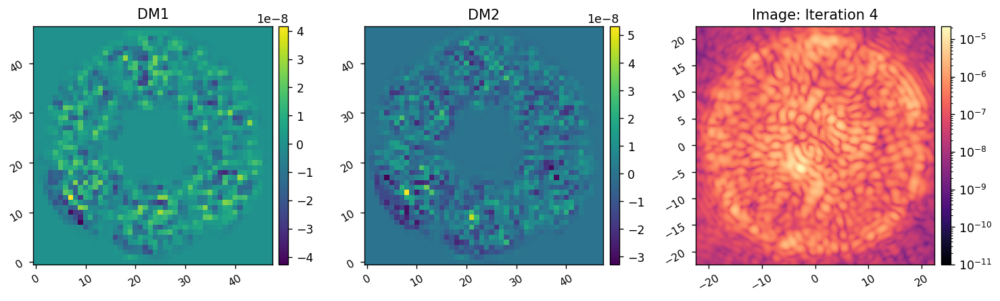

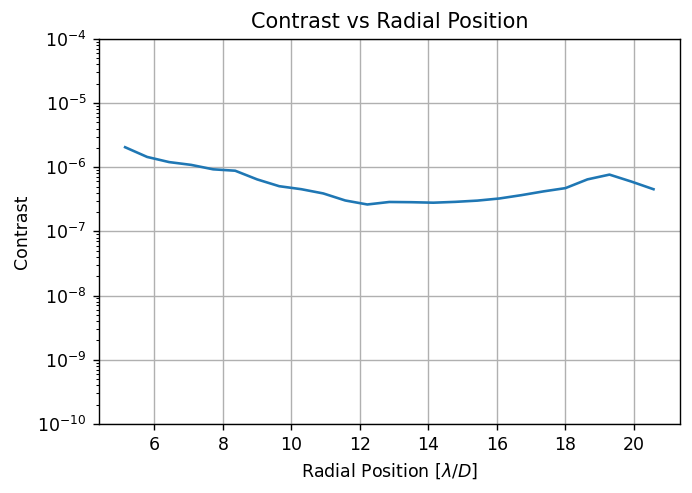

	Closed-loop iteration 5 / 10
	Mean Contrast of this iteration: 3.633e-07


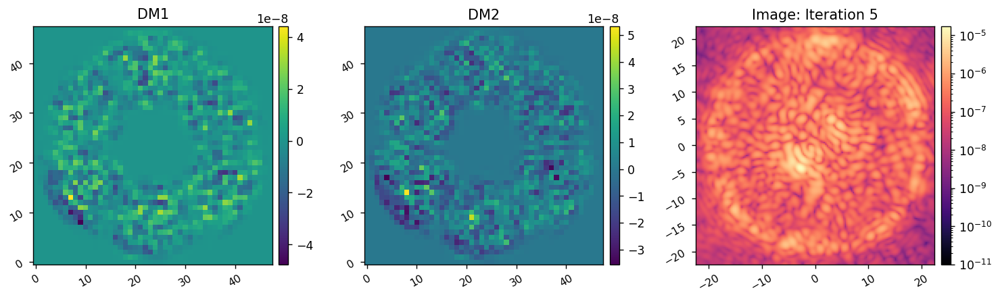

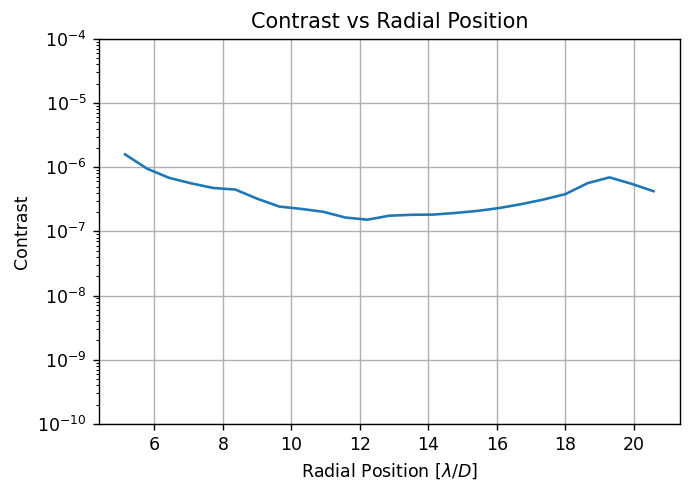

	Closed-loop iteration 6 / 10
	Mean Contrast of this iteration: 2.932e-07


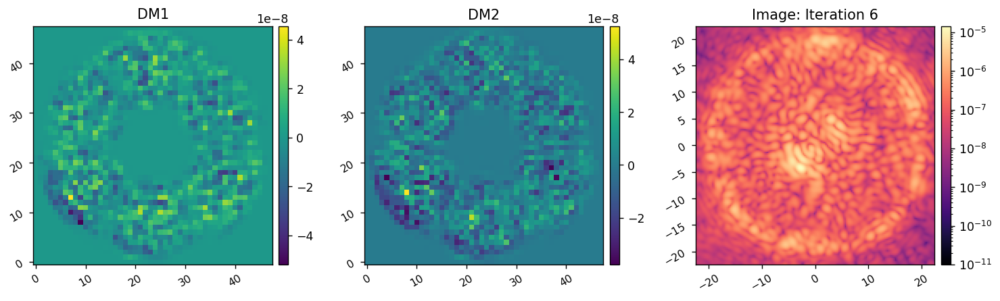

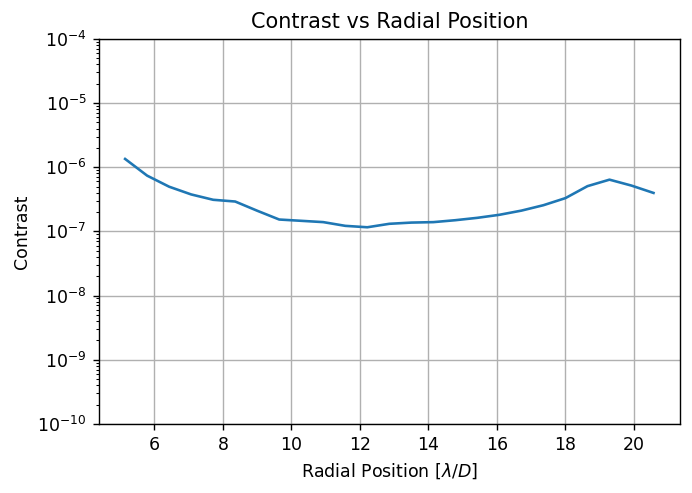

	Closed-loop iteration 7 / 10
	Mean Contrast of this iteration: 2.549e-07


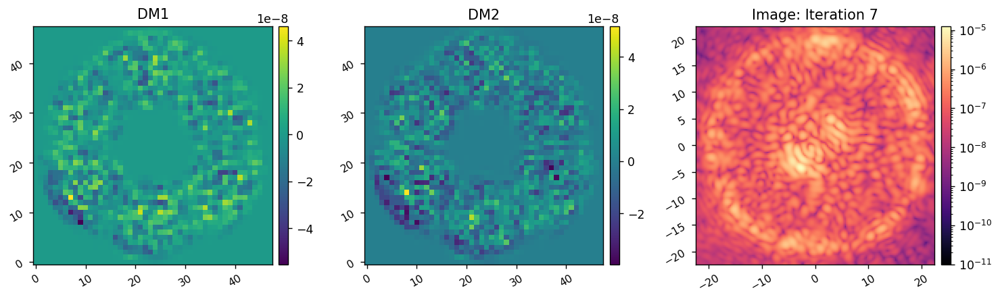

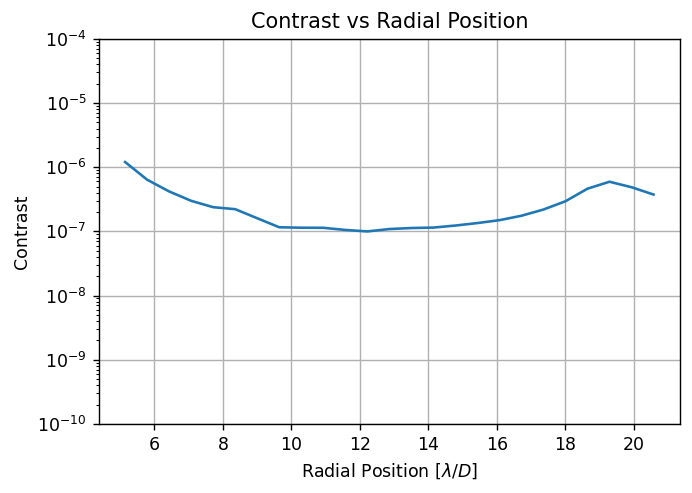

	Closed-loop iteration 8 / 10
	Mean Contrast of this iteration: 2.293e-07


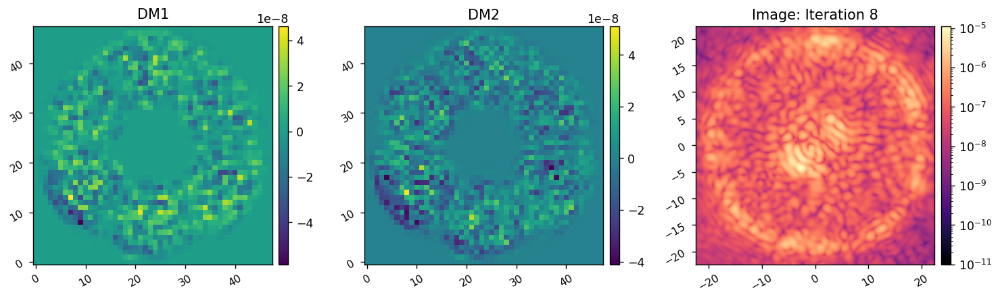

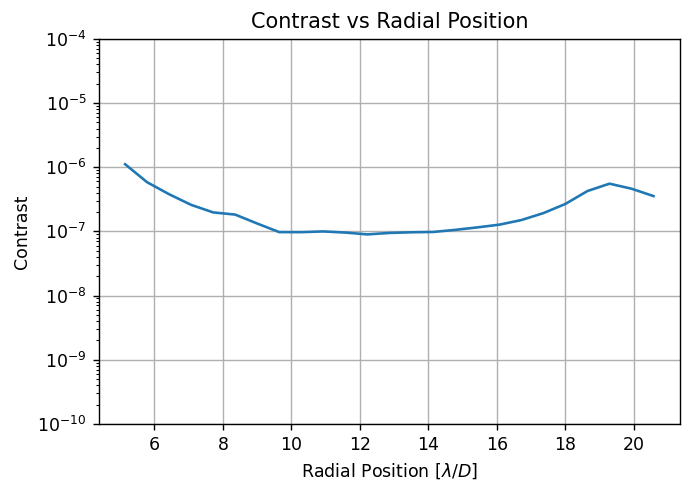

	Closed-loop iteration 9 / 10
	Mean Contrast of this iteration: 2.101e-07


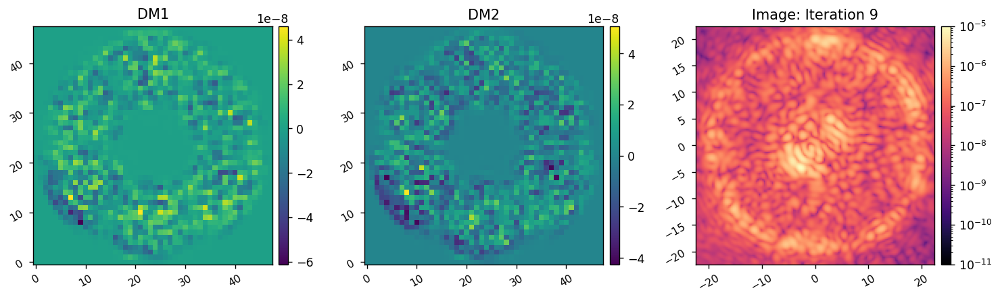

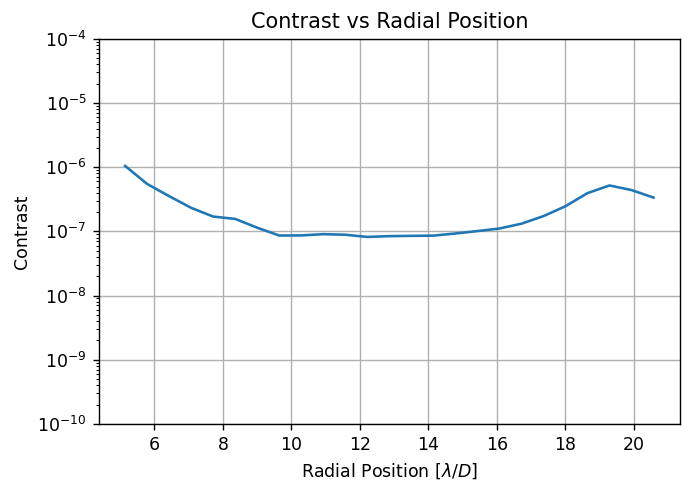

	Closed-loop iteration 10 / 10
	Mean Contrast of this iteration: 1.949e-07


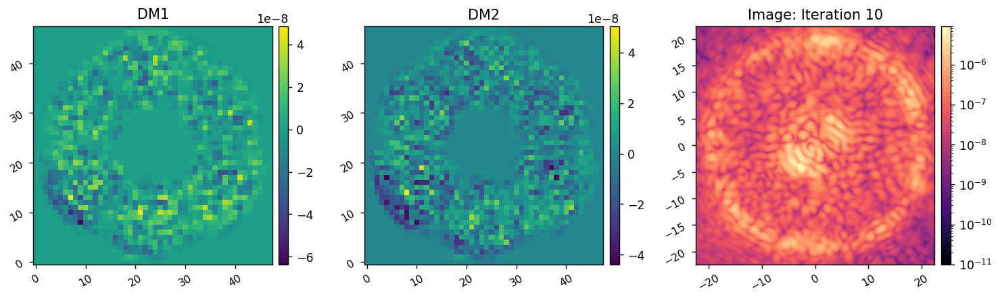

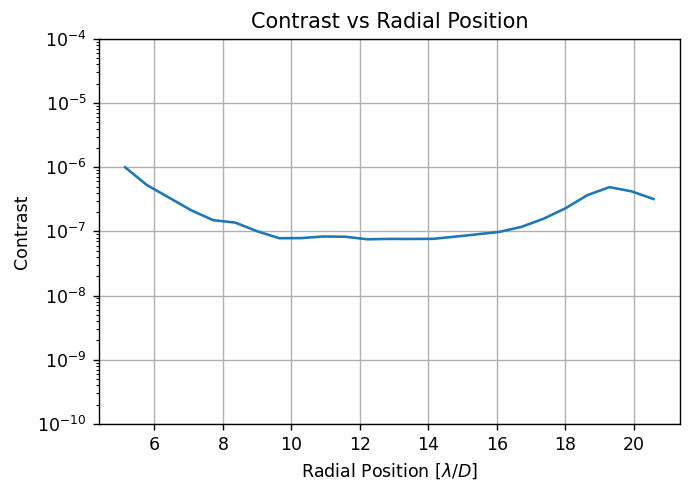

Closed loop completed in 59.698s.
Using regulariztaion condition number of 1.0e-02 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 11 / 15
	Mean Contrast of this iteration: 1.927e-07


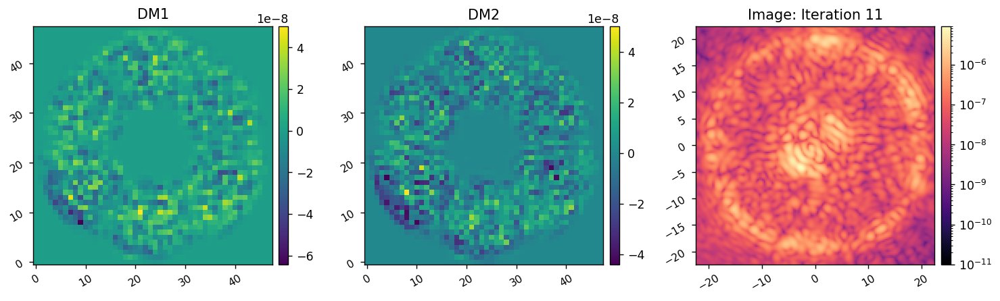

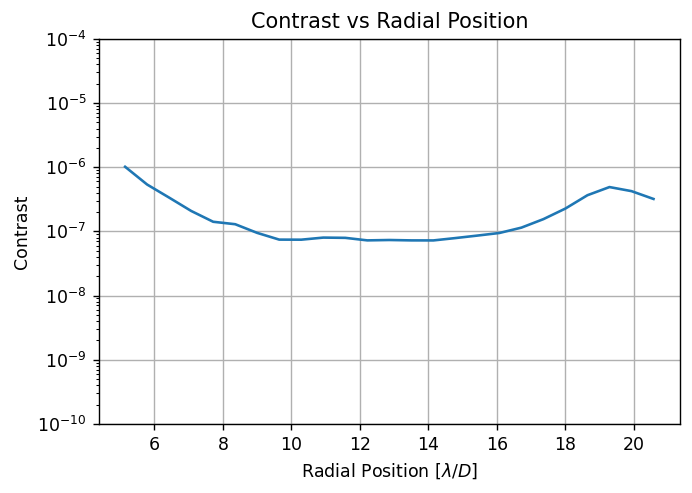

	Closed-loop iteration 12 / 15
	Mean Contrast of this iteration: 1.912e-07


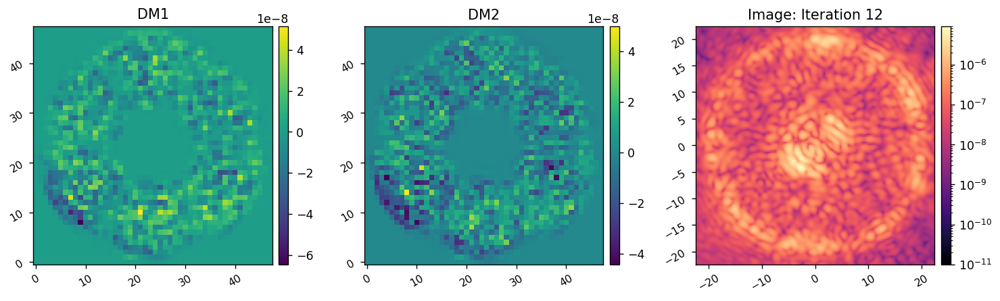

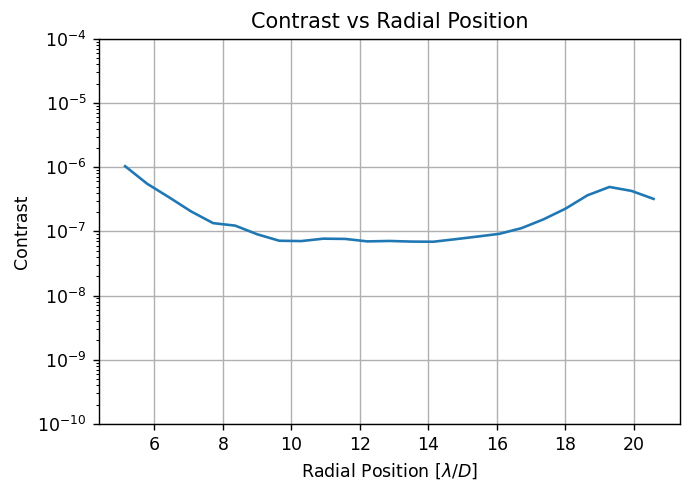

	Closed-loop iteration 13 / 15
	Mean Contrast of this iteration: 1.903e-07


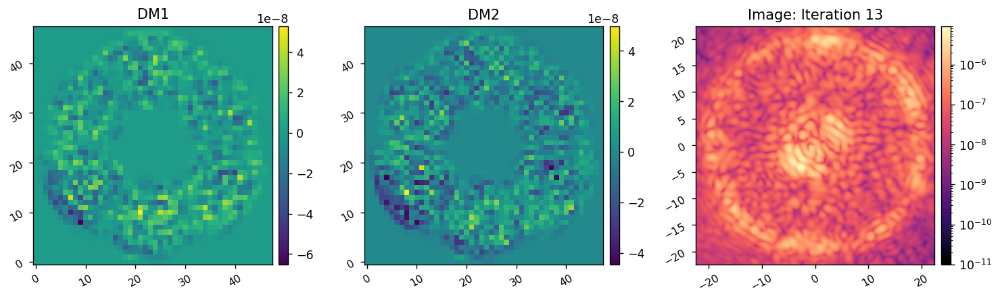

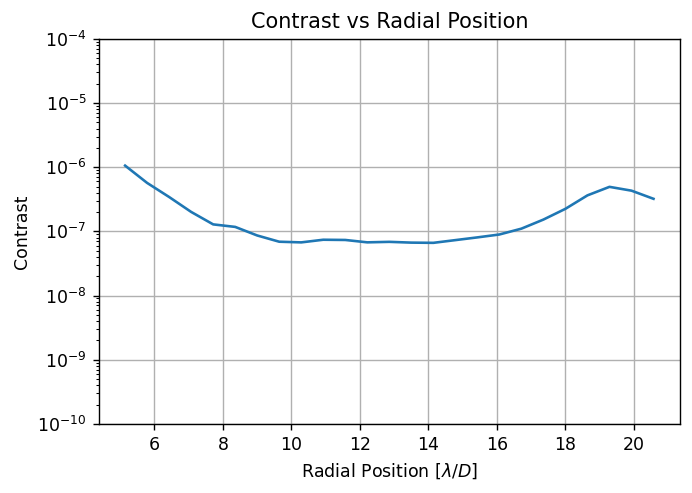

	Closed-loop iteration 14 / 15
	Mean Contrast of this iteration: 1.896e-07


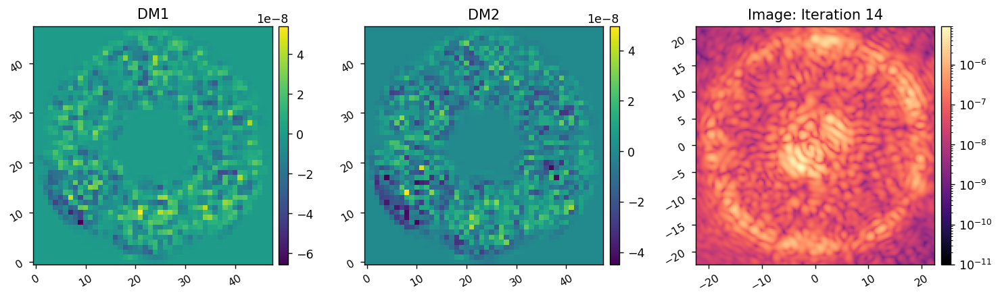

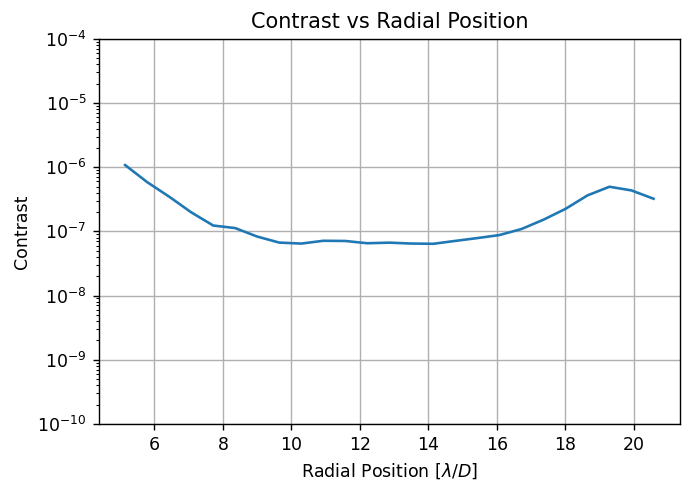

	Closed-loop iteration 15 / 15
	Mean Contrast of this iteration: 1.891e-07


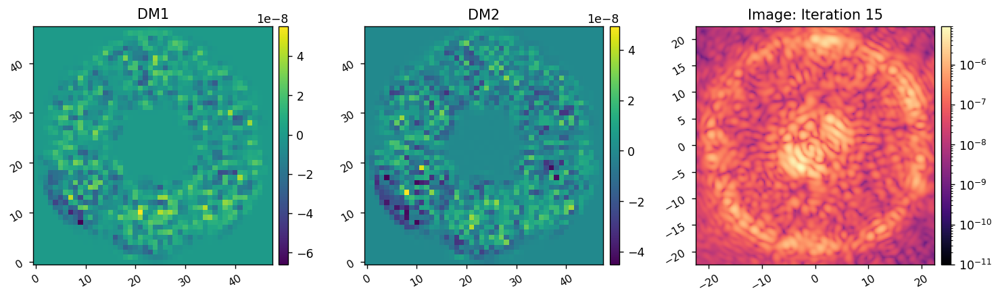

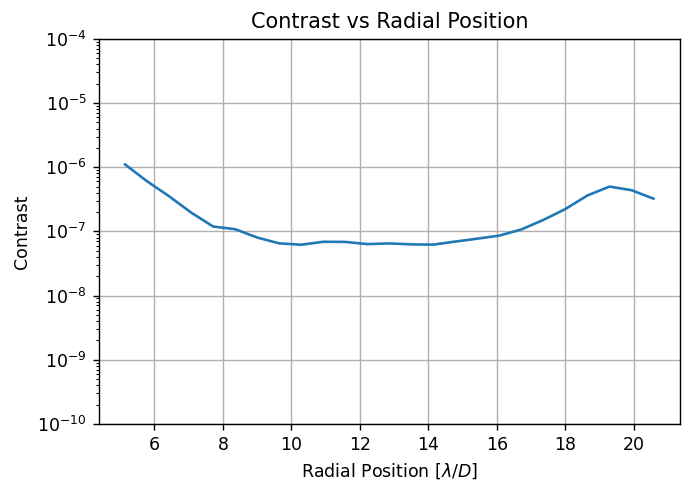

Closed loop completed in 29.997s.
Using regulariztaion condition number of 1.0e-01 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 16 / 20
	Mean Contrast of this iteration: 1.906e-07


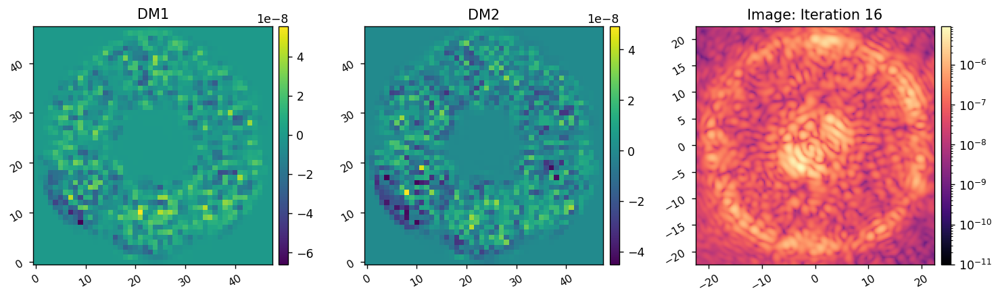

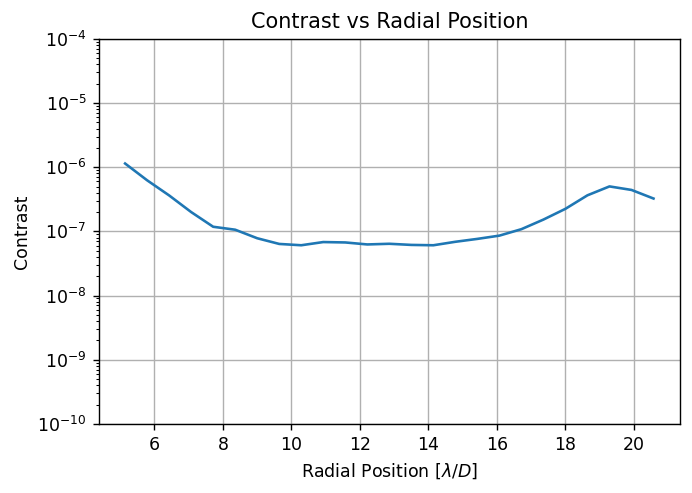

	Closed-loop iteration 17 / 20
	Mean Contrast of this iteration: 1.923e-07


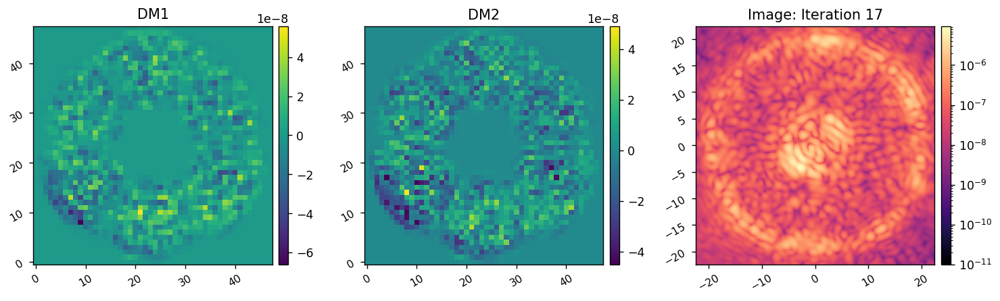

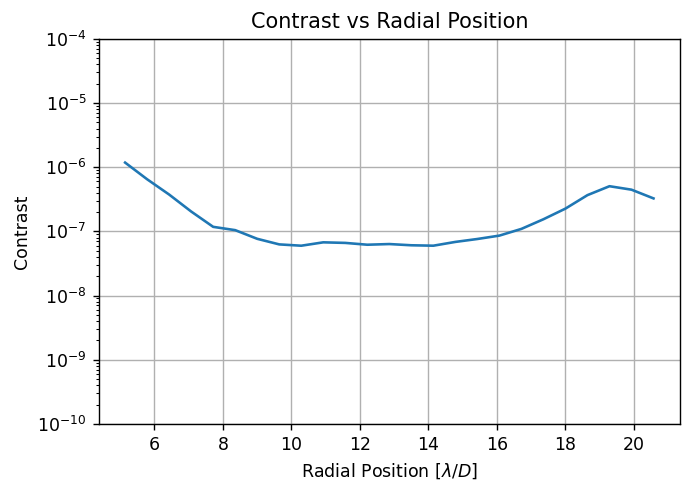

	Closed-loop iteration 18 / 20
	Mean Contrast of this iteration: 1.942e-07


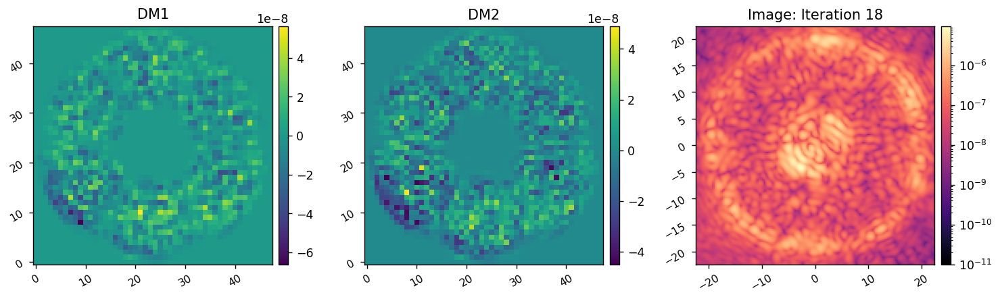

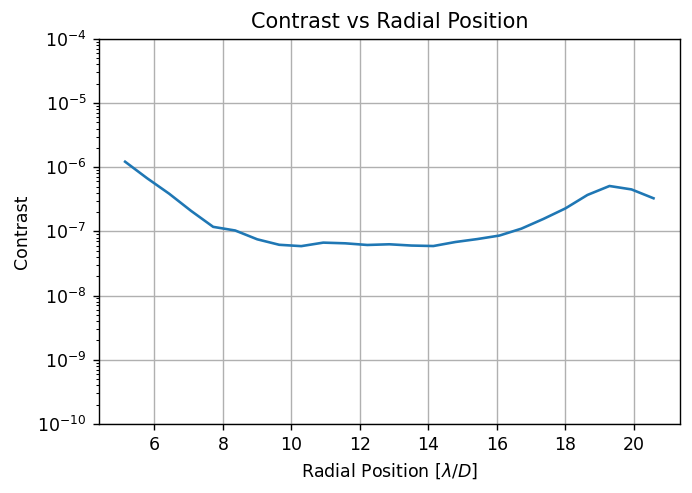

	Closed-loop iteration 19 / 20
	Mean Contrast of this iteration: 1.960e-07


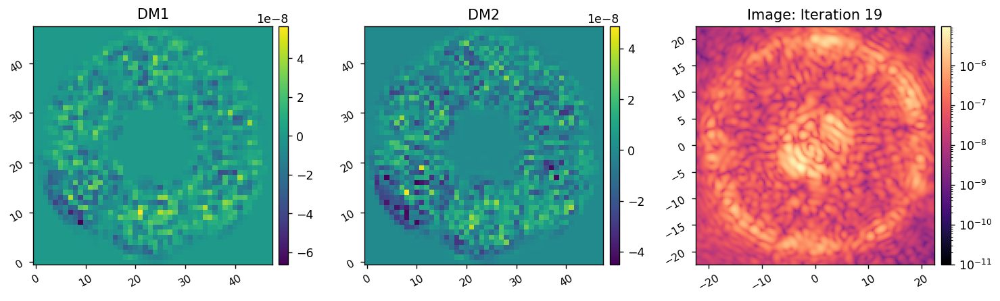

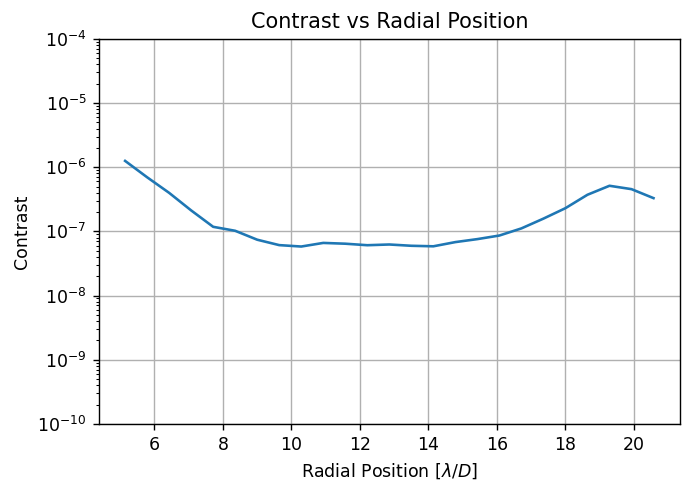

	Closed-loop iteration 20 / 20
	Mean Contrast of this iteration: 1.979e-07


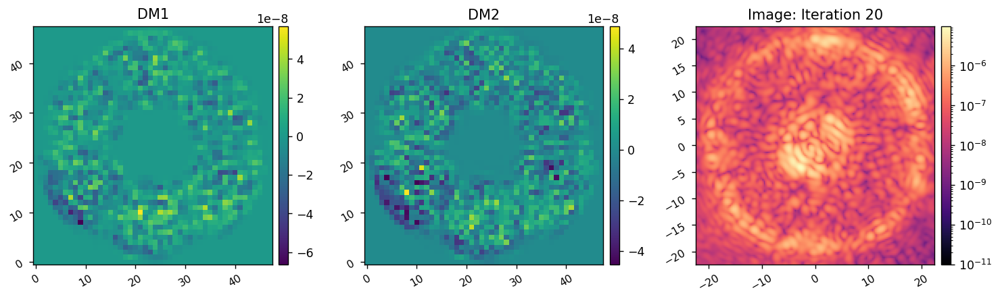

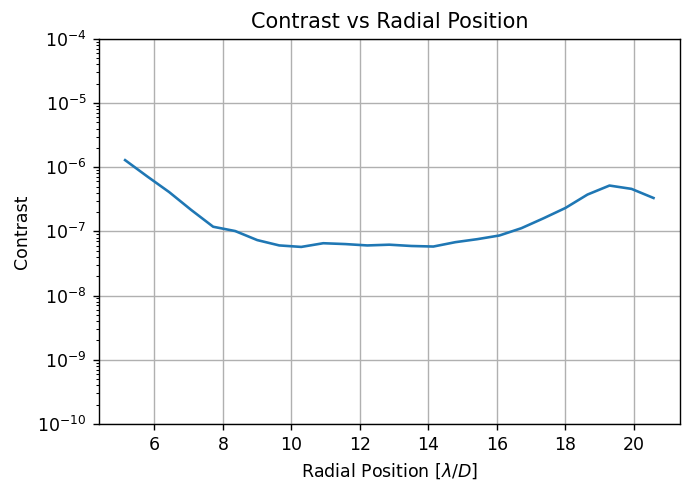

Closed loop completed in 30.006s.
Using regulariztaion condition number of 1.0e-04 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 21 / 25
	Mean Contrast of this iteration: 1.475e-07


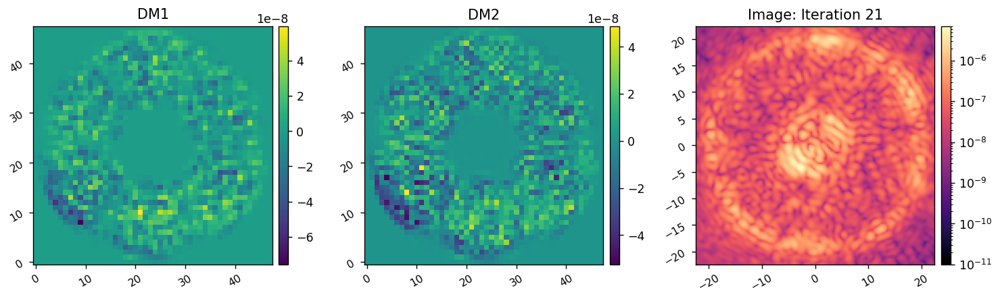

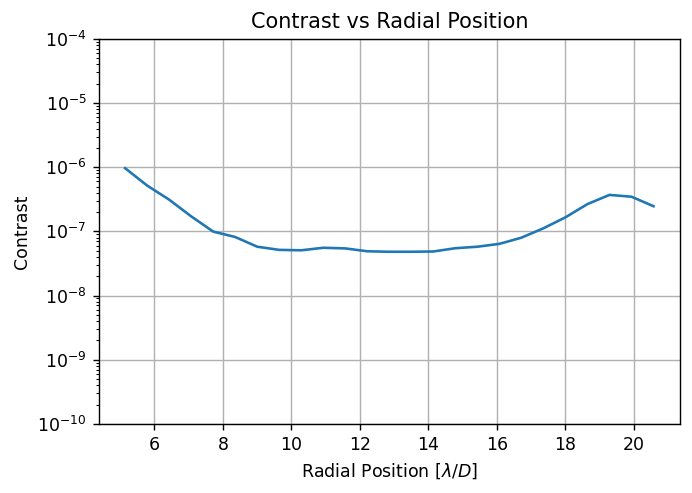

	Closed-loop iteration 22 / 25
	Mean Contrast of this iteration: 1.185e-07


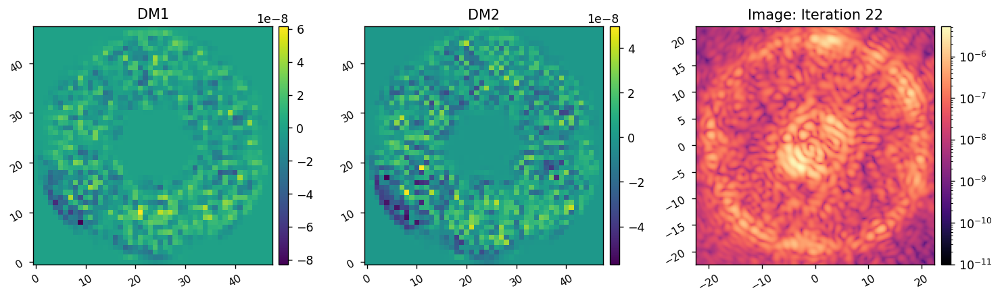

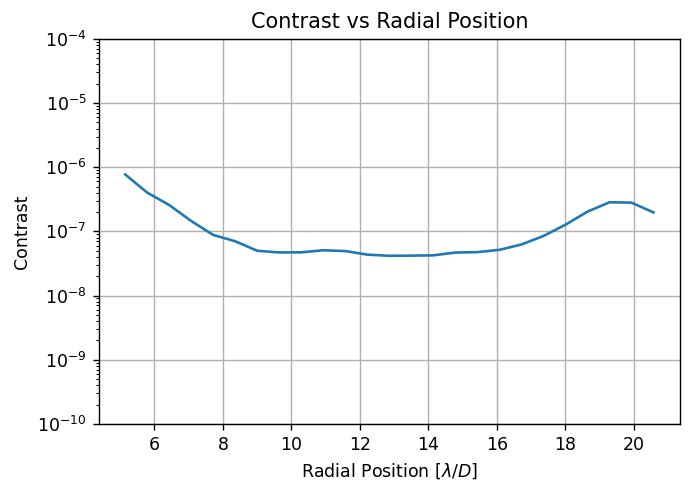

	Closed-loop iteration 23 / 25
	Mean Contrast of this iteration: 9.914e-08


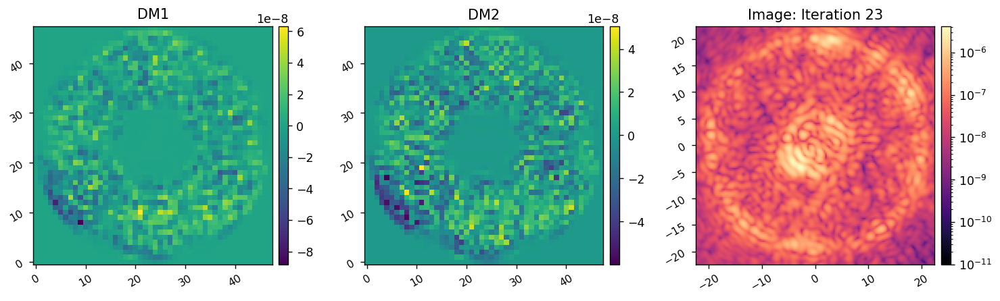

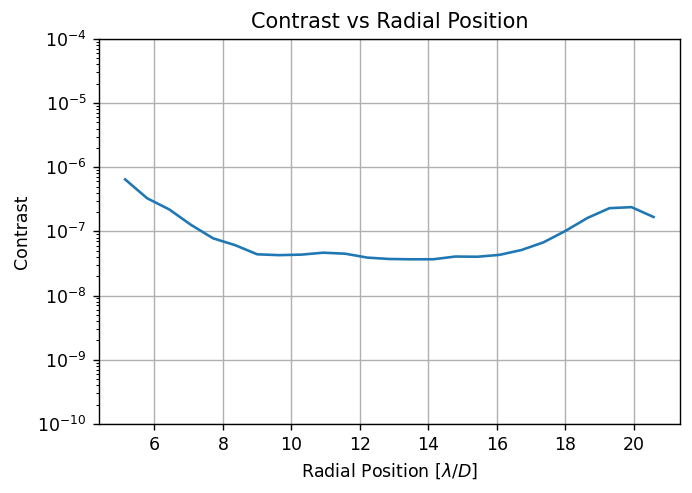

	Closed-loop iteration 24 / 25
	Mean Contrast of this iteration: 8.507e-08


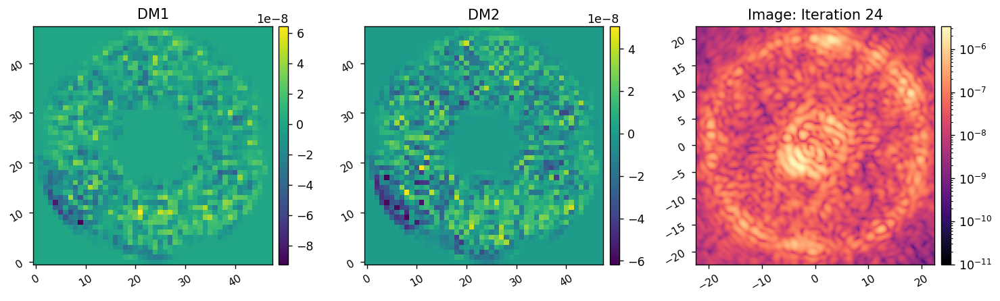

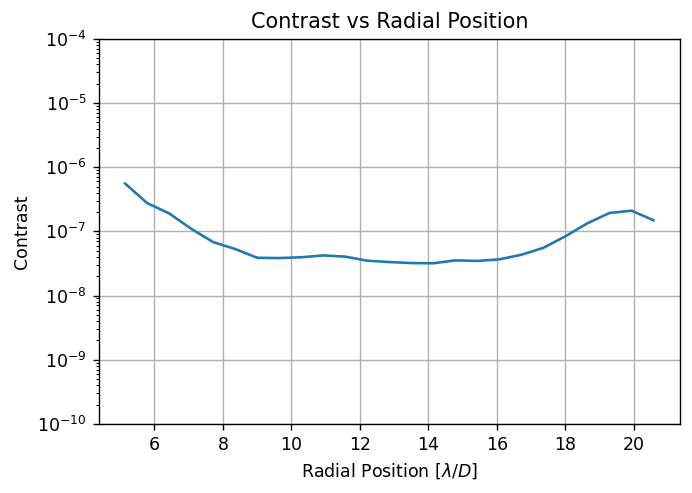

	Closed-loop iteration 25 / 25
	Mean Contrast of this iteration: 7.441e-08


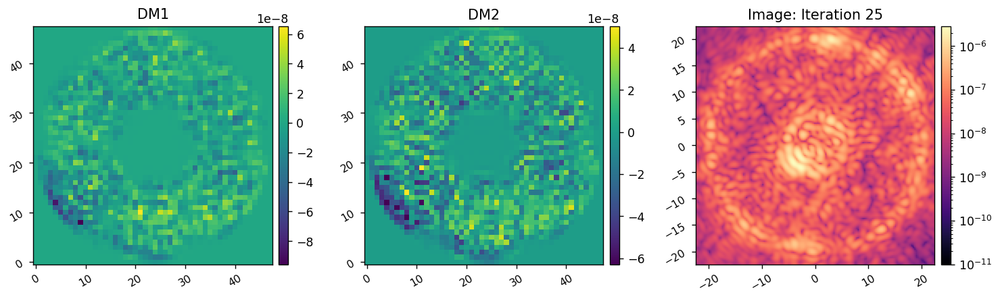

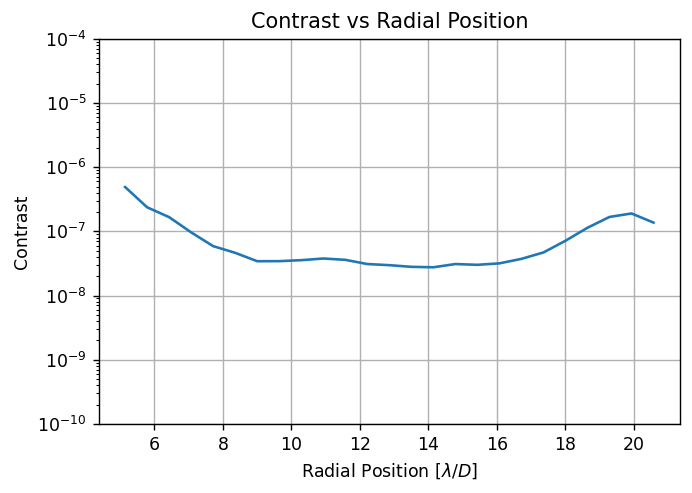

Closed loop completed in 30.042s.
Using regulariztaion condition number of 1.0e-02 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 26 / 30
	Mean Contrast of this iteration: 7.133e-08


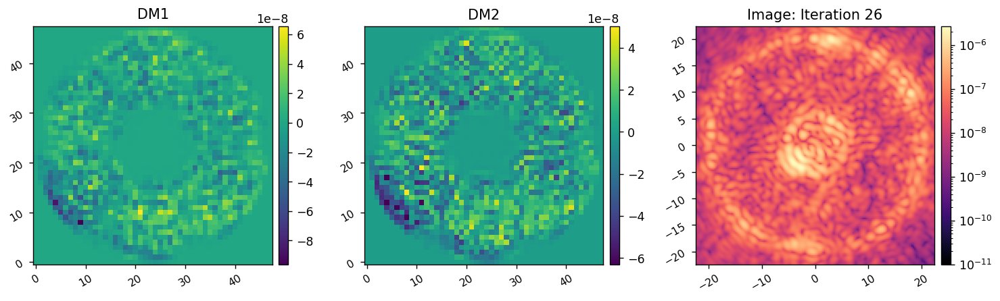

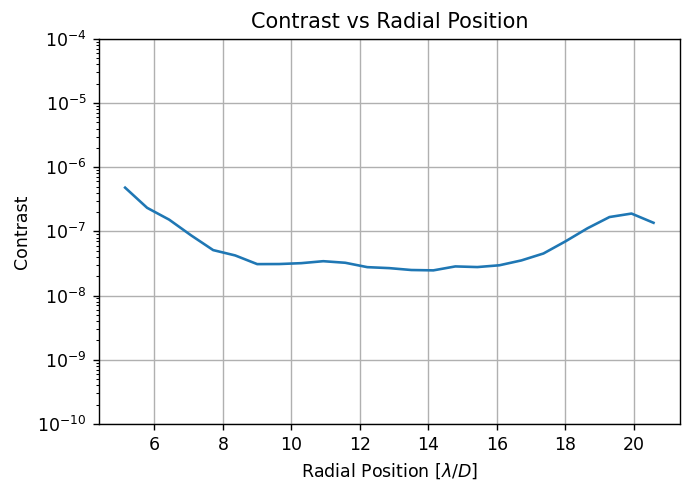

	Closed-loop iteration 27 / 30
	Mean Contrast of this iteration: 6.956e-08


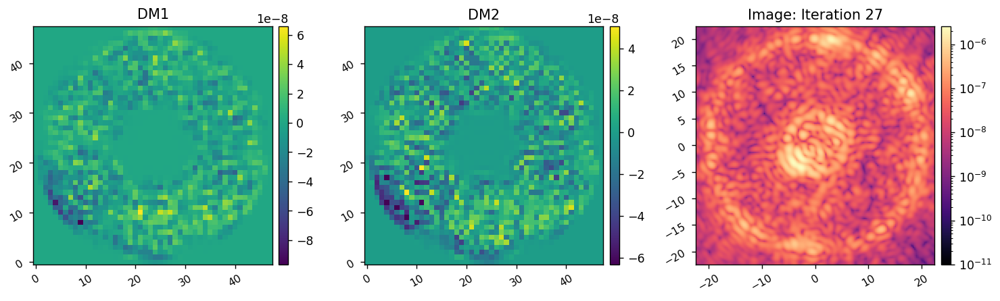

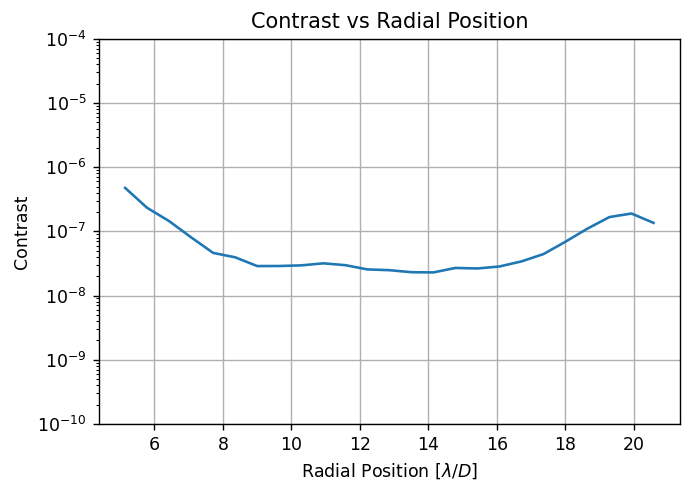

	Closed-loop iteration 28 / 30
	Mean Contrast of this iteration: 6.845e-08


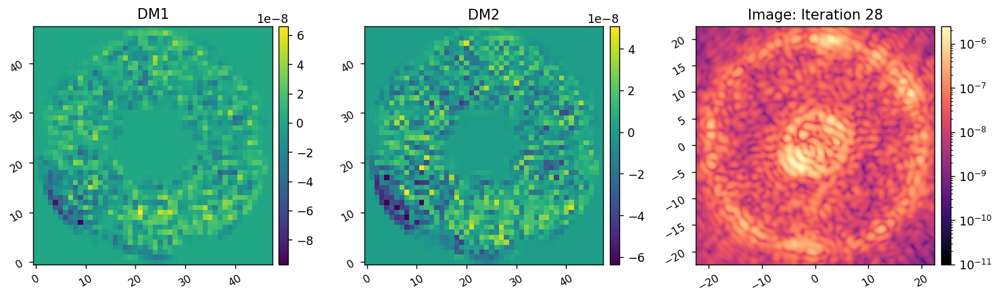

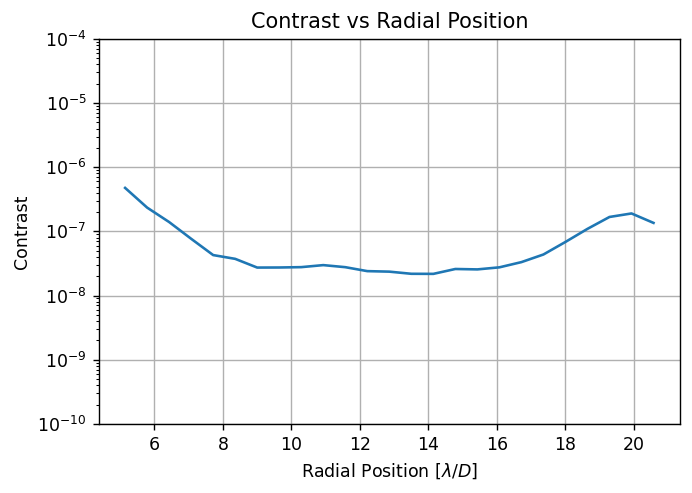

	Closed-loop iteration 29 / 30
	Mean Contrast of this iteration: 6.772e-08


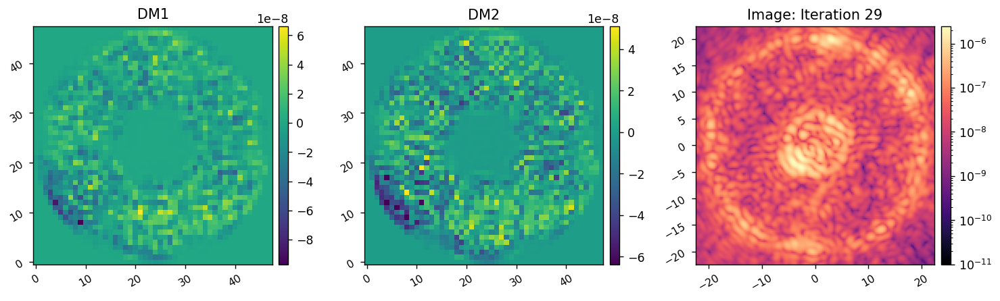

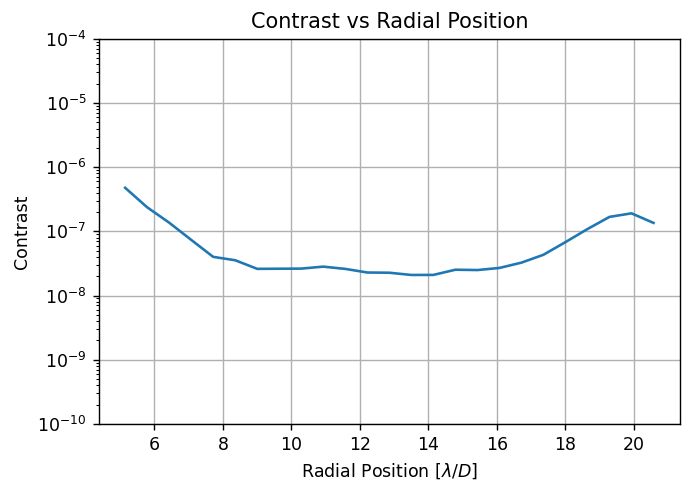

	Closed-loop iteration 30 / 30
	Mean Contrast of this iteration: 6.722e-08


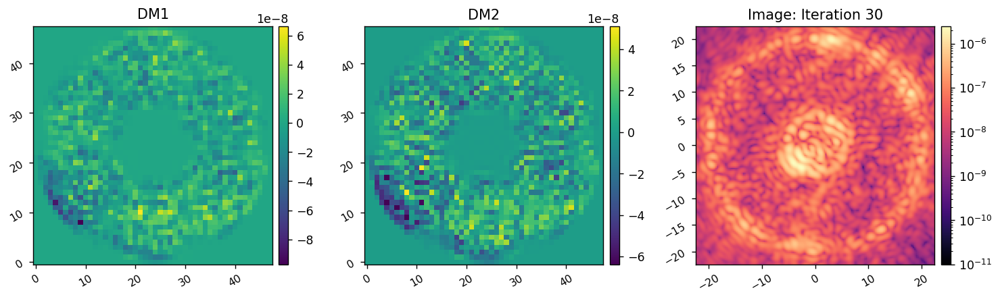

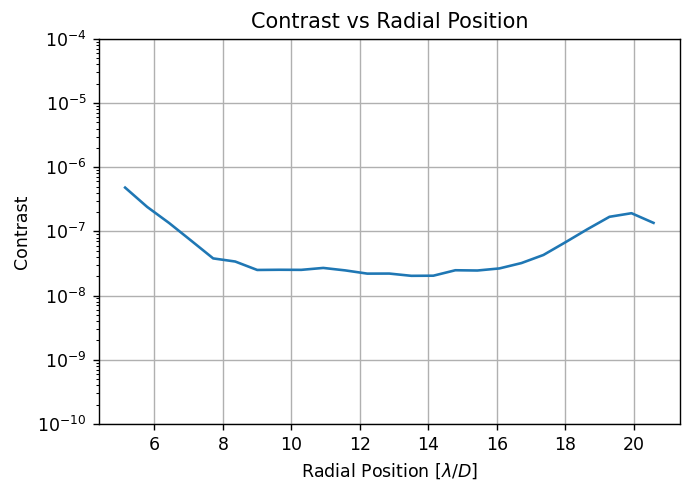

Closed loop completed in 30.116s.
Using regulariztaion condition number of 1.0e-03 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 31 / 35
	Mean Contrast of this iteration: 6.514e-08


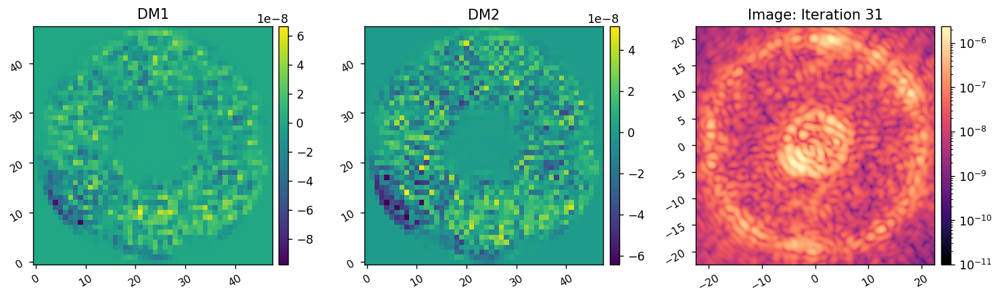

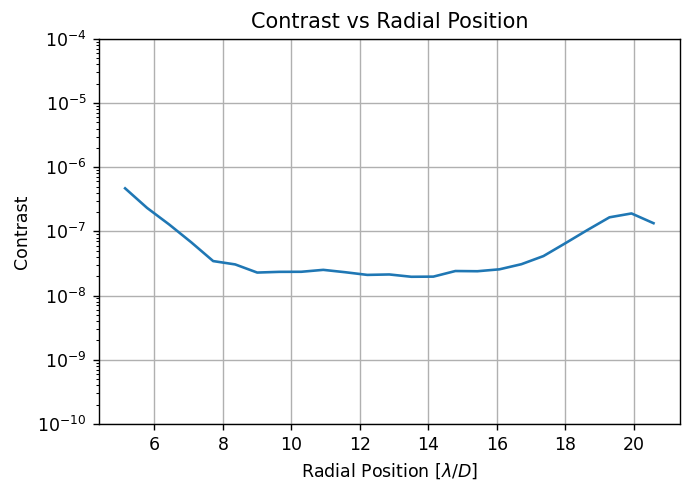

	Closed-loop iteration 32 / 35
	Mean Contrast of this iteration: 6.356e-08


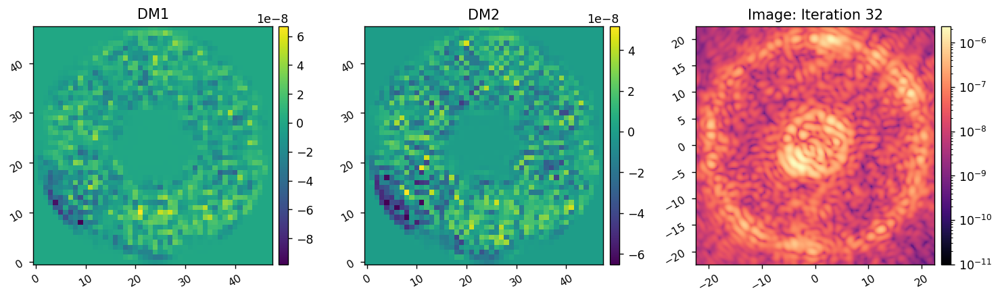

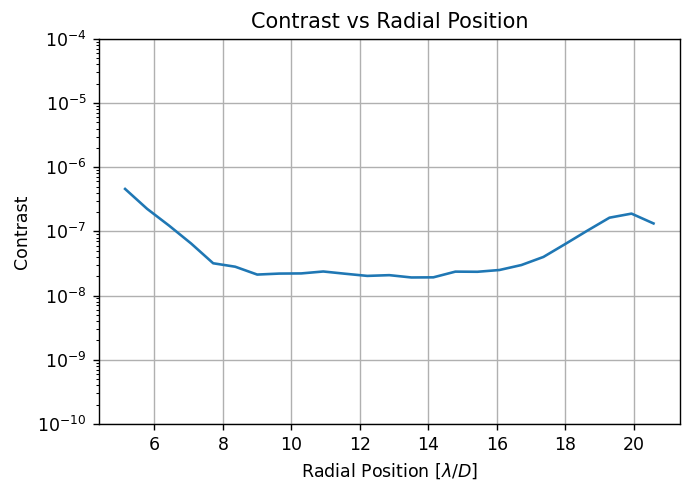

	Closed-loop iteration 33 / 35
	Mean Contrast of this iteration: 6.230e-08


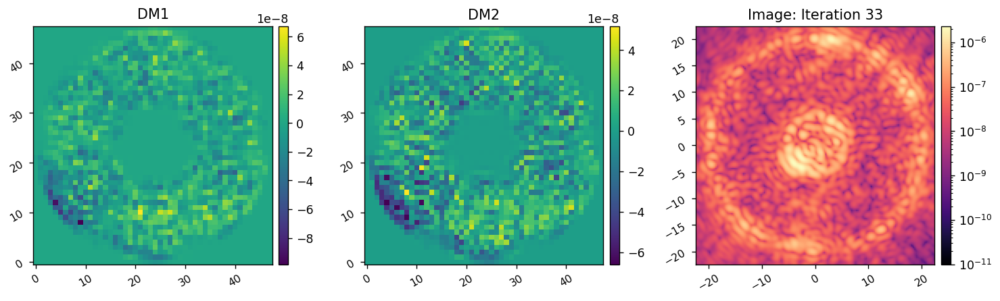

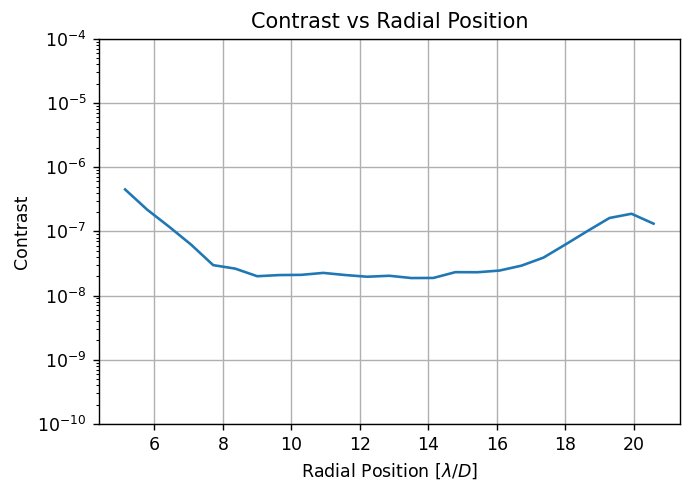

	Closed-loop iteration 34 / 35
	Mean Contrast of this iteration: 6.124e-08


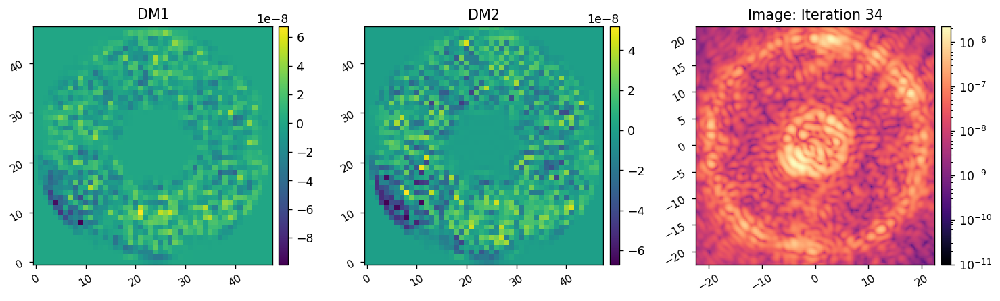

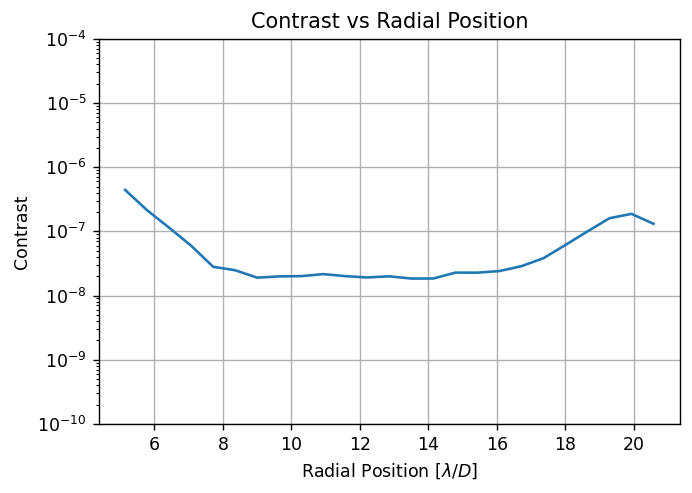

	Closed-loop iteration 35 / 35
	Mean Contrast of this iteration: 6.034e-08


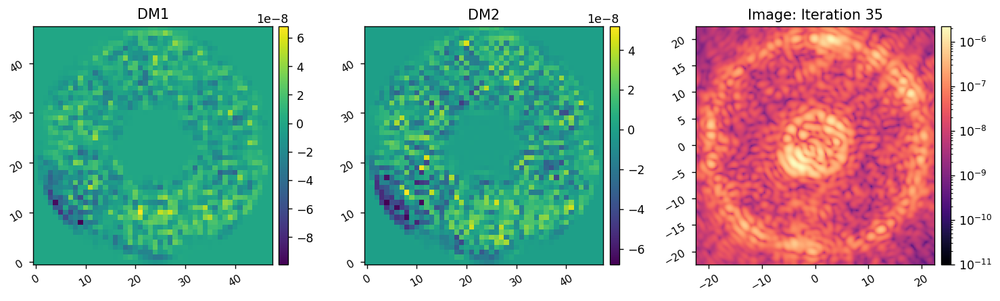

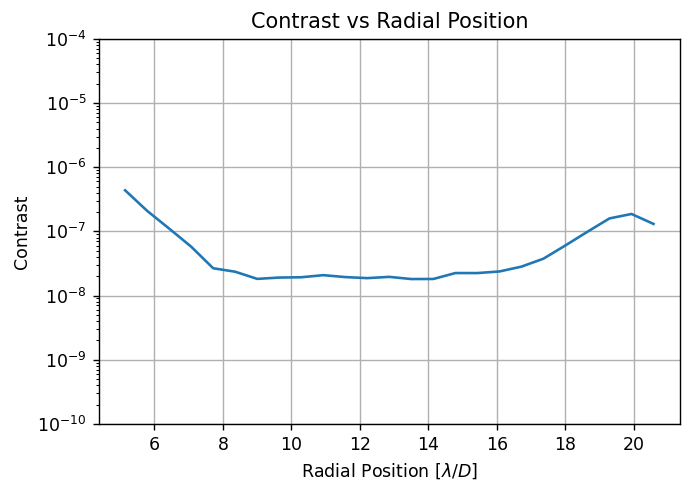

Closed loop completed in 29.860s.
Using regulariztaion condition number of 1.0e-01 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 36 / 40
	Mean Contrast of this iteration: 6.048e-08


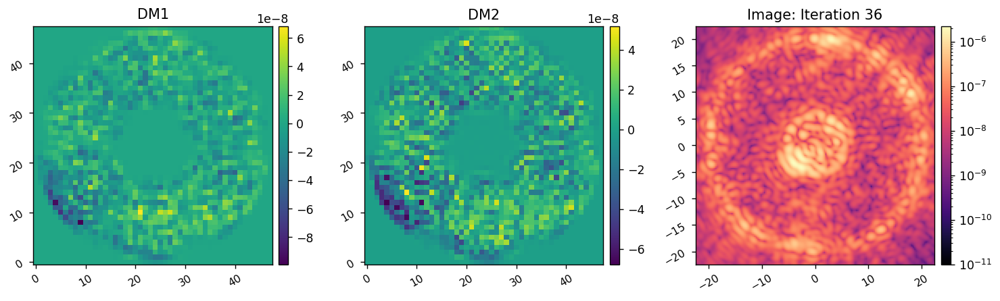

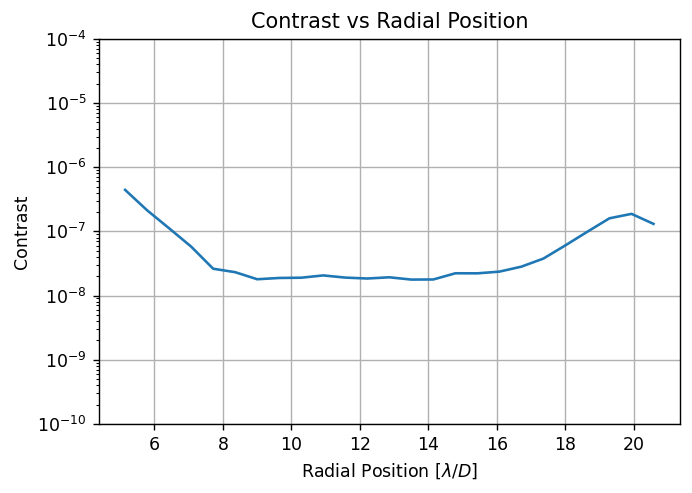

	Closed-loop iteration 37 / 40
	Mean Contrast of this iteration: 6.071e-08


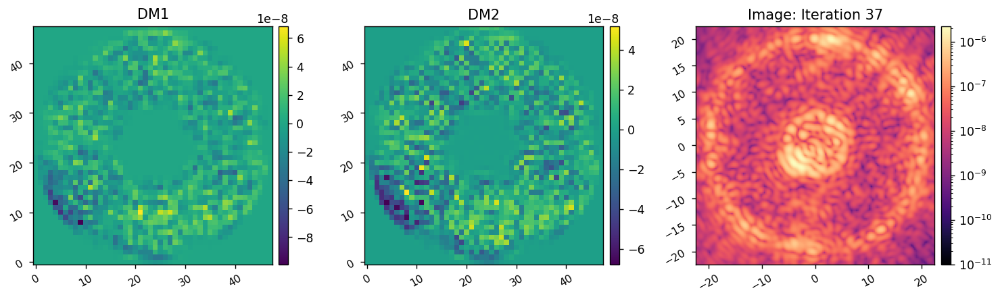

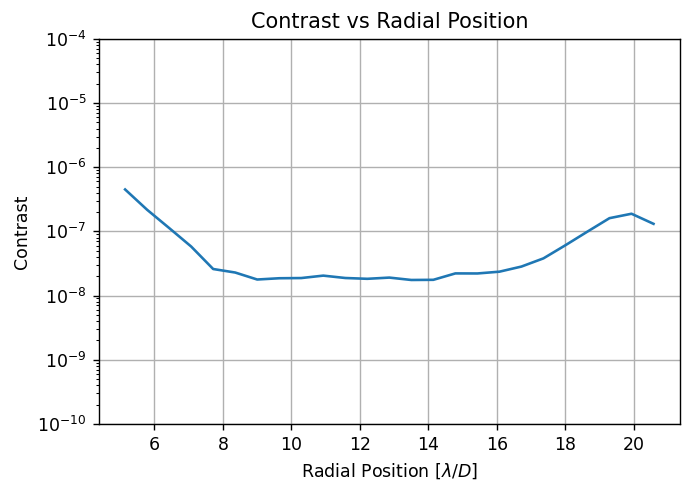

	Closed-loop iteration 38 / 40
	Mean Contrast of this iteration: 6.096e-08


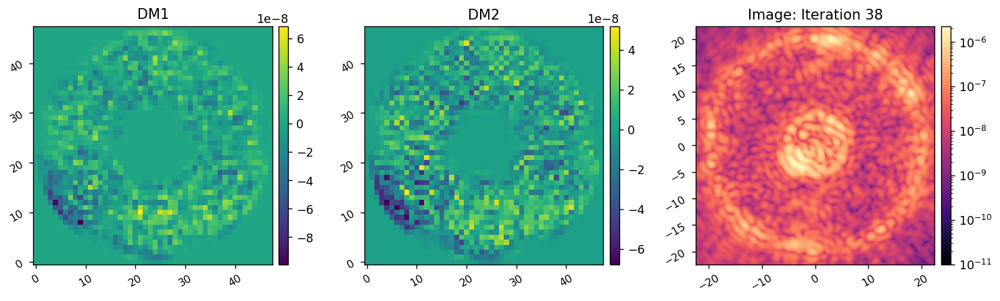

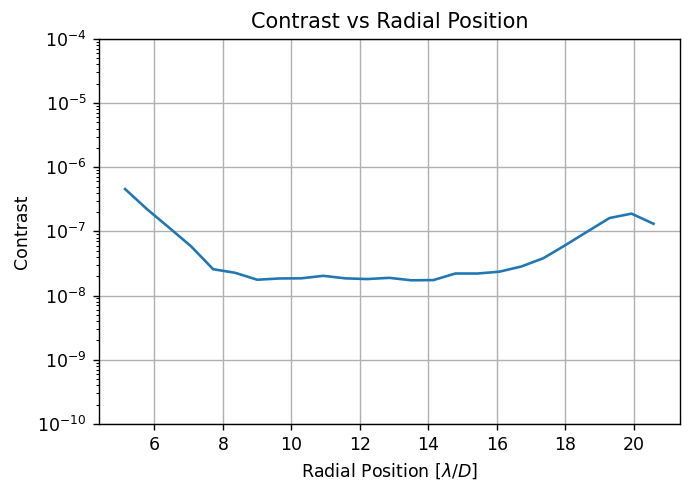

	Closed-loop iteration 39 / 40
	Mean Contrast of this iteration: 6.123e-08


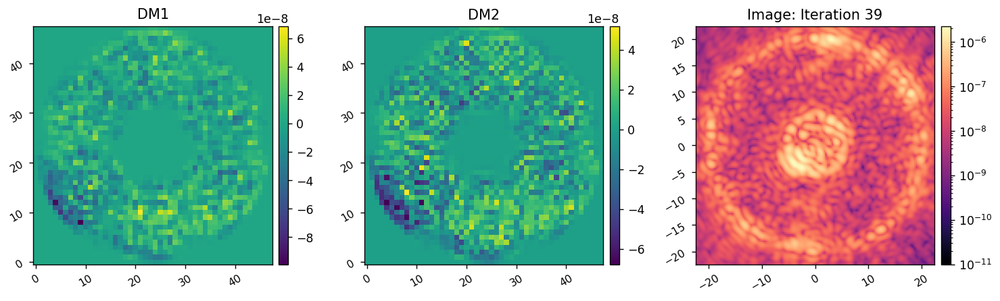

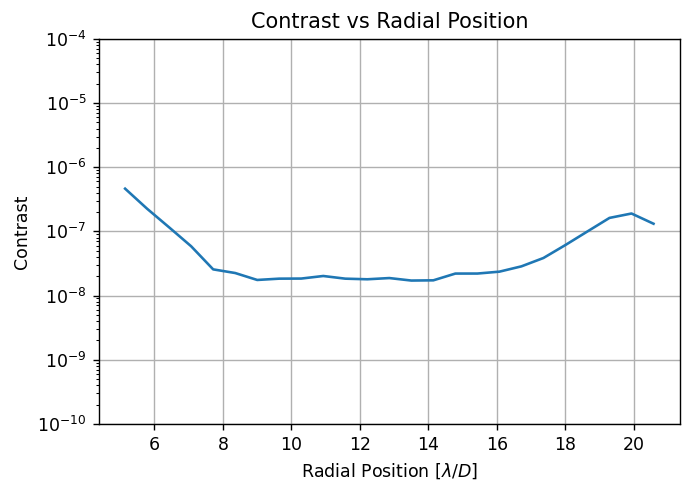

	Closed-loop iteration 40 / 40
	Mean Contrast of this iteration: 6.151e-08


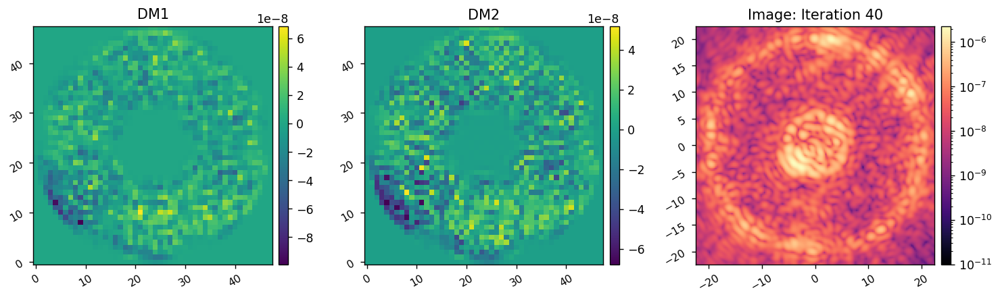

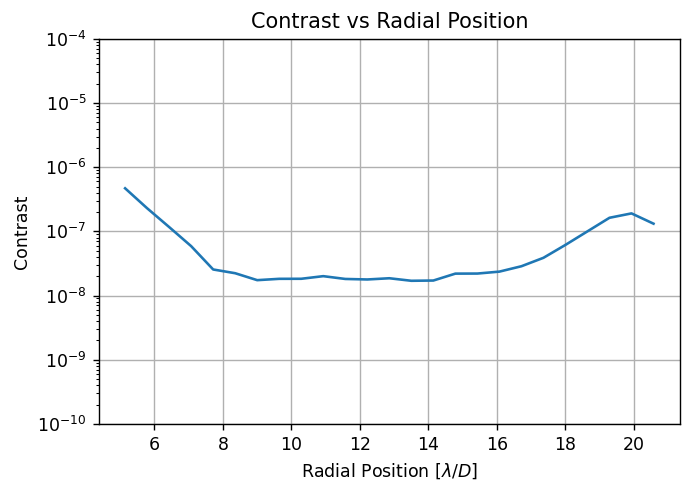

Closed loop completed in 30.275s.
Using regulariztaion condition number of 1.0e-03 for 5 iterations.
(27048, 27048) (27048, 3608)
Running iEFC...
	Closed-loop iteration 41 / 45
	Mean Contrast of this iteration: 6.048e-08


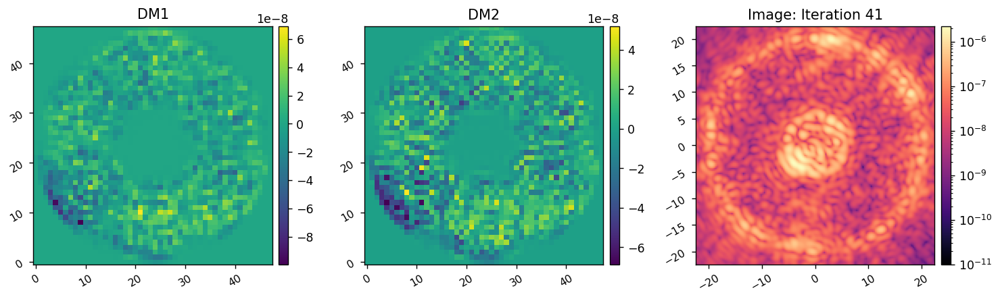

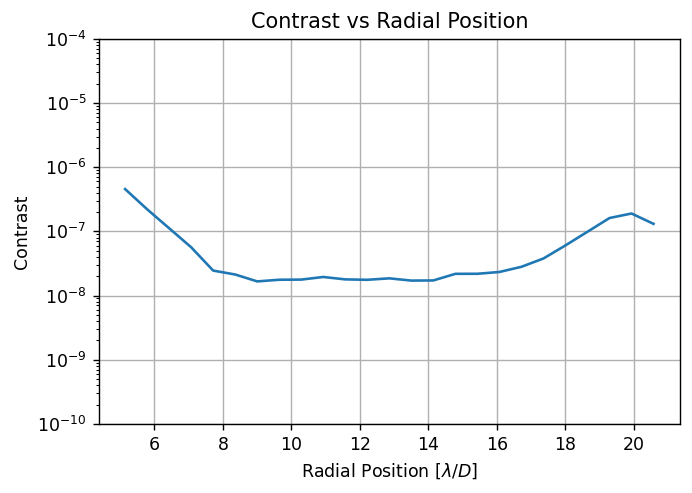

	Closed-loop iteration 42 / 45
	Mean Contrast of this iteration: 5.968e-08


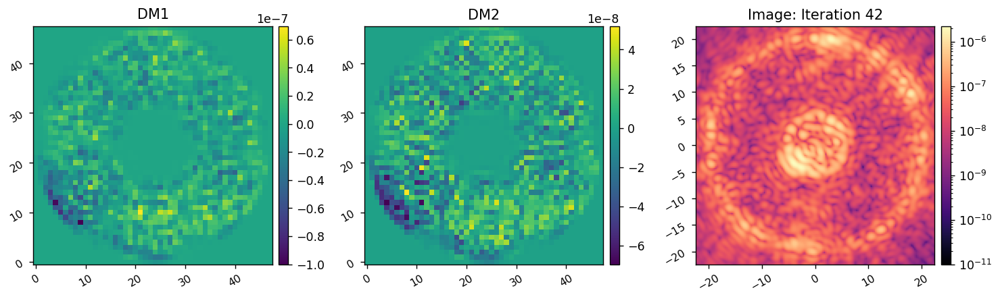

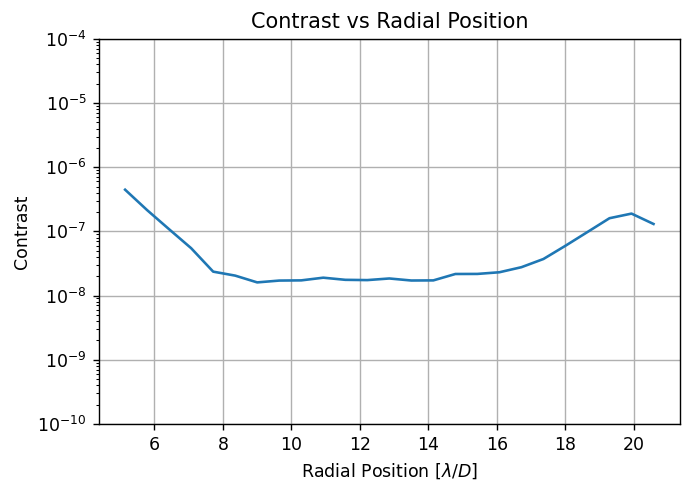

	Closed-loop iteration 43 / 45
	Mean Contrast of this iteration: 5.897e-08


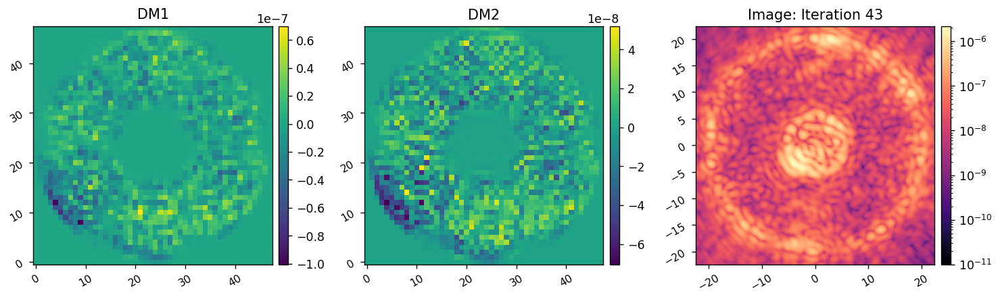

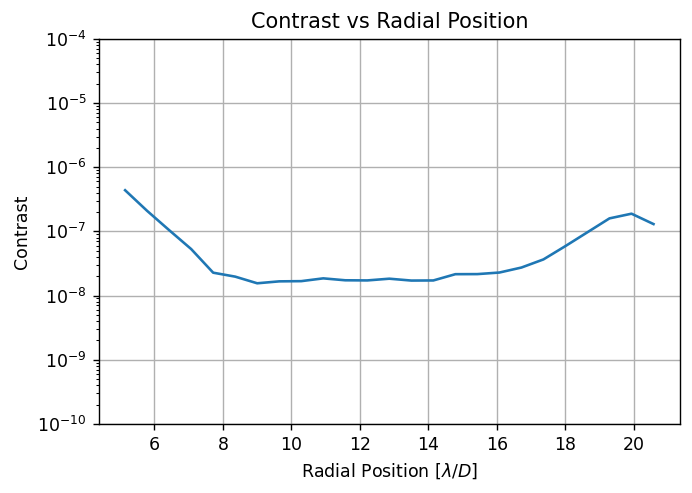

	Closed-loop iteration 44 / 45
	Mean Contrast of this iteration: 5.832e-08


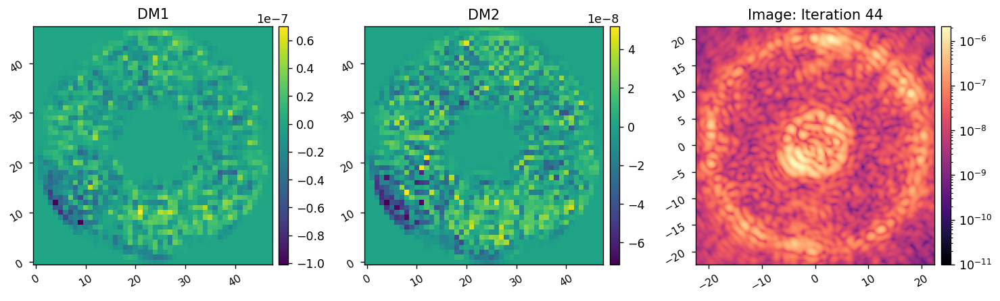

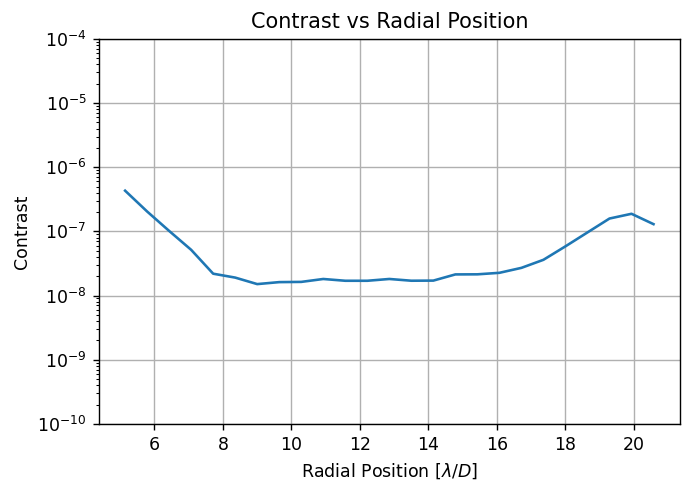

	Closed-loop iteration 45 / 45
	Mean Contrast of this iteration: 5.771e-08


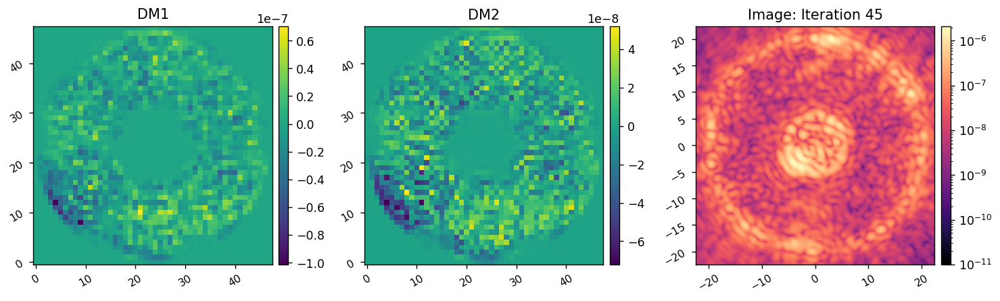

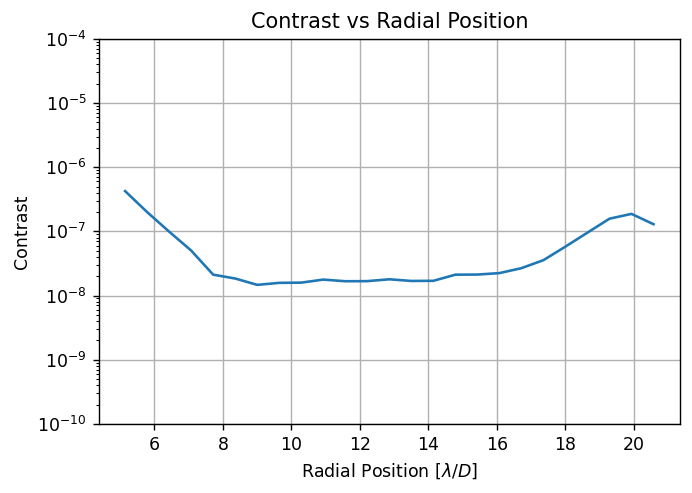

Closed loop completed in 29.835s.


In [25]:
reload(iefc_2dm)
reload(utils)

mode.reset_dms()

reg_fun = utils.WeightedLeastSquares
reg_kwargs = {
    'weight_map':weight_map,
    'nprobes':probe_modes.shape[0],
}
# reg_conds = [(1e-3,2), (1e-2,2)]
reg_conds = [(1e-3,10), (1e-2,5), (1e-1,5), (1e-4,5), (1e-2,5), (1e-3,5), (1e-1,5), (1e-3, 5)]

images, dm1_commands, dm2_commands = iefc_2dm.run_varying_regs(mode, 
                                                                   reg_fun,
                                                                 reg_conds,
                                                             reg_kwargs,
                                                             response_matrix,
                                                                probe_modes, 
                                                               probe_amp, 
                                                                ensure_np_array(calib_modes),
                                                                control_mask,
                                                                num_iterations=10, 
                                                                loop_gain=0.5, 
                                                                leakage=0.0,
                                                                plot_all=True,
                                                                plot_radial_contrast=True
                                                                 )